# **Setting Up**

In [1]:
from IPython.display import display, HTML
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.ensemble import VotingClassifier
from sklearn.feature_selection import SelectKBest, f_classif, VarianceThreshold
from sklearn.metrics import davies_bouldin_score, roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc, silhouette_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

pd.options.display.float_format = '{:,.2f}'.format

data = pd.read_csv('/Users/lunatic/Downloads/programing/python/ml_prj/data.csv')

def display_table(df, title="Data Table"):
    styled_df = df.style.set_properties(**{
        'background-color': 'white',
        'color': 'black',
        'border': '1px solid black'
    }).set_table_styles([
        {'selector': 'thead th', 'props': [('background-color', 'black'), ('color', 'white'), ('font-weight', 'bold')]},
        {'selector': 'tbody tr:nth-child(even)', 'props': [('background-color', '#f2f2f2')]},
        {'selector': 'tbody tr:nth-child(odd)', 'props': [('background-color', 'white')]},
        {'selector': 'tbody th', 'props': [('color', 'black'), ('font-weight', 'normal')]}
    ])
    html = f"""
    <div style="font-size:20px; font-weight:bold; margin-bottom:10px;">{title}</div>
    {styled_df.to_html()}
    """
    display(HTML(html))

print("Train Data Shape:", data.shape)

Train Data Shape: (159256, 24)


# **EXPLORATORY DATA ANALYSIS**

EXPLORATORY DATA ANALYSIS:



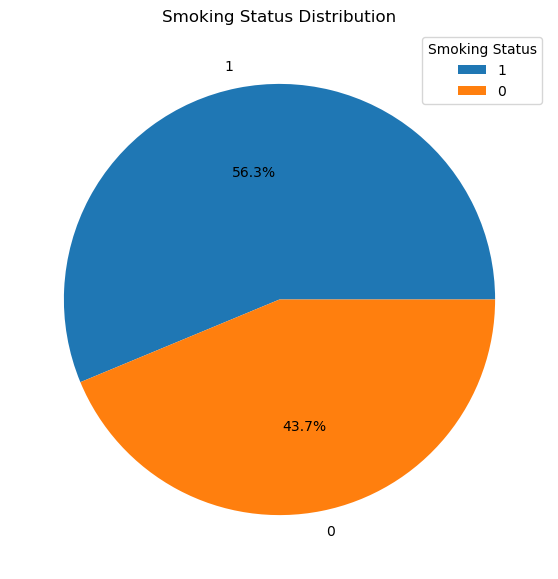

,Feature,Number of Empty Cells
0,age,0
1,height(cm),0
2,weight(kg),0
3,waist(cm),0
4,eyesight(left),0
5,eyesight(right),0
6,hearing(left),0
7,hearing(right),0
8,systolic,0
9,relaxation,0



2. Number of Duplicate instances: 0 





,Data Type,Unique Values
age,int64,18
height(cm),int64,14
weight(kg),int64,28
waist(cm),float64,531
eyesight(left),float64,20
eyesight(right),float64,17
hearing(left),int64,2
hearing(right),int64,2
systolic,int64,112
relaxation,int64,75


,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries
count,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000
mean,44.306626,165.266929,67.143662,83.001990,1.005798,1.000989,1.023974,1.023421,122.503648,76.874071,98.352552,195.796165,127.616046,55.852684,114.607682,14.796965,1.074233,0.892764,25.516853,26.550296,36.216004,0.197996
std,11.842286,8.818970,12.586198,8.957937,0.402113,0.392299,0.152969,0.151238,12.729315,8.994642,15.329740,28.396959,66.188989,13.964141,28.158931,1.431213,0.347856,0.179346,9.464882,17.753070,31.204643,0.398490
min,20.000000,135.000000,30.000000,51.000000,0.100000,0.100000,1.000000,1.000000,77.000000,44.000000,46.000000,77.000000,8.000000,9.000000,1.000000,4.900000,1.000000,0.100000,6.000000,1.000000,2.000000,0.000000
25%,40.000000,160.000000,60.000000,77.000000,0.800000,0.800000,1.000000,1.000000,114.000000,70.000000,90.000000,175.000000,77.000000,45.000000,95.000000,13.800000,1.000000,0.800000,20.000000,16.000000,18.000000,0.000000
50%,40.000000,165.000000,65.000000,83.000000,1.000000,1.000000,1.000000,1.000000,121.000000,78.000000,96.000000,196.000000,115.000000,54.000000,114.000000,15.000000,1.000000,0.900000,24.000000,22.000000,27.000000,0.000000
75%,55.000000,170.000000,75.000000,89.000000,1.200000,1.200000,1.000000,1.000000,130.000000,82.000000,103.000000,217.000000,165.000000,64.000000,133.000000,15.800000,1.000000,1.000000,29.000000,32.000000,44.000000,0.000000
max,85.000000,190.000000,130.000000,127.000000,9.900000,9.900000,2.000000,2.000000,213.000000,133.000000,375.000000,393.000000,766.000000,136.000000,1860.000000,21.000000,6.000000,9.900000,778.000000,2914.000000,999.000000,1.000000


In [2]:
print("EXPLORATORY DATA ANALYSIS:\n")

x = data.drop(['id', 'smoking'], axis=1)
y = data['smoking']

plt.figure(figsize=(7, 7))
plt.pie(y.value_counts(), labels=y.unique(), autopct='%1.1f%%')
plt.title('Smoking Status Distribution')
plt.legend(title='Smoking Status', loc='best')
plt.show()
print('\n')

temp_table = x.isnull().sum().reset_index(name='Number of Empty Cells').rename(columns={'index': 'Feature'})
display_table(temp_table, "1. Number of empty cells for each feature:")

print("\n2. Number of Duplicate instances:",data.duplicated().sum(),"\n")

table = pd.DataFrame()
table['Data Type'] = x.dtypes
table['Unique Values'] = x.nunique().values
print('\n')
display_table(table, "3. Datatypes and unique value count for each feature:\n")

temp_table= x.describe(include = 'all')
display_table(temp_table,"4. Statistics sumary for each feature:\n" )

# Inference

- **No Missing Data**: All features have zero empty cells, indicating a complete dataset with no missing values.
- **Data Types**: The dataset includes a mix of `int64` and `float64` data types, with numerical features spread across discrete (e.g., `hearing(left/right)`, `Urine protein`) and continuous variables (e.g., `waist(cm)`, `serum creatinine`).
- **Unique Values**:
    - Features like `hearing(left/right)` and `dental caries` have very few unique values, suggesting they are categorical or binary.
    - High unique values in features like `waist(cm)` and `Gtp` indicate a continuous range, useful for detailed numeric analysis.
    - Moderate unique values in features like `systolic` and `Cholesterol` imply potential variability that may require scaling but likely no further categorization.


---




### 1. **Demographics** (`age`, `height(cm)`, `weight(kg)`, `waist(cm)`)

- **Age**: The average age is approximately 44, with a spread indicating representation across younger and older adults.
- **Height and Weight**: Mean values for height (165 cm) and weight (67 kg) align with general population averages, with standard deviations showing a balanced spread across different body types.
- **Waist Circumference**: The mean of 83 cm with a broad range suggests varied body compositions, possibly covering normal and overweight individuals.

### 2. **Sensory and Physical Attributes** (`eyesight(left/right)`, `hearing(left/right)`)

- **Eyesight**: Average values near 1.0 indicate typical vision, though values as high as 9.9 may represent those with significant visual impairment.
- **Hearing**: Predominantly values of 1 and 2 suggest a binary categorization (normal and impaired hearing) with a minor spread.

### 3. **Blood Pressure** (`systolic`, `relaxation`)

- **Systolic and Diastolic**: Average systolic and diastolic (relaxation) blood pressures fall within normal ranges (122/76), though higher values in the upper quartile indicate some prevalence of elevated or hypertensive readings in the population.

### 4. **Biochemical Indicators** (`fasting blood sugar`, `Cholesterol`, `triglyceride`, `HDL`, `LDL`)

- **Cholesterol and Triglycerides**: Averages around 200 mg/dL for cholesterol and 128 mg/dL for triglycerides, with some higher quartile values, suggesting certain cases of hyperlipidemia.
- **HDL and LDL**: HDL (good cholesterol) is generally in a healthy range around 55 mg/dL. LDL varies with some elevated values, possibly indicative of cardiovascular risk among some individuals.

### 5. **Liver and Kidney Health** (`AST`, `ALT`, `serum creatinine`)

- **AST and ALT**: Mean levels suggest liver health within standard ranges, though the upper limits indicate that some individuals may have liver conditions.
- **Serum Creatinine**: Average creatinine levels near 0.9 suggest generally healthy kidney function with occasional higher values, which may point to some individuals at risk of renal issues.

### 6. **Other Health Indicators** (`hemoglobin`, `Urine protein`, `dental caries`)

- **Hemoglobin**: With an average around 15 g/dL, hemoglobin levels are within a standard range, supporting overall blood health in the population.
- **Urine Protein**: Averages close to 1 indicate normal protein levels for most individuals.
- **Dental Caries**: Binary values suggest the presence (1) or absence (0) of dental caries, with the mean indicating a low prevalence.


---



# Conclusion
The data suggests a few next steps for deeper analysis and preparation:

- **Outlier Exploration**: Given high values in biochemical indicators (like triglycerides and LDL) and measurements (such as waist circumference), examining the influence of these outliers could reveal health risk patterns in certain subgroups.

- **Scaling and Normalization**: For effective modeling, especially with machine learning techniques that are sensitive to scale, standardizing variables such as height, weight, triglycerides, and waist circumference would ensure consistent data interpretation.

- **Further Analysis**: Exploring correlations among LDL, HDL, and blood pressure might uncover cardiovascular risk trends, aiding in understanding health patterns within the population.

# **FEATURE DISTRIBUTION ANALYSIS**

FEATURE DISTRIBUTION ANALYSIS:


1. Histogram of each feature


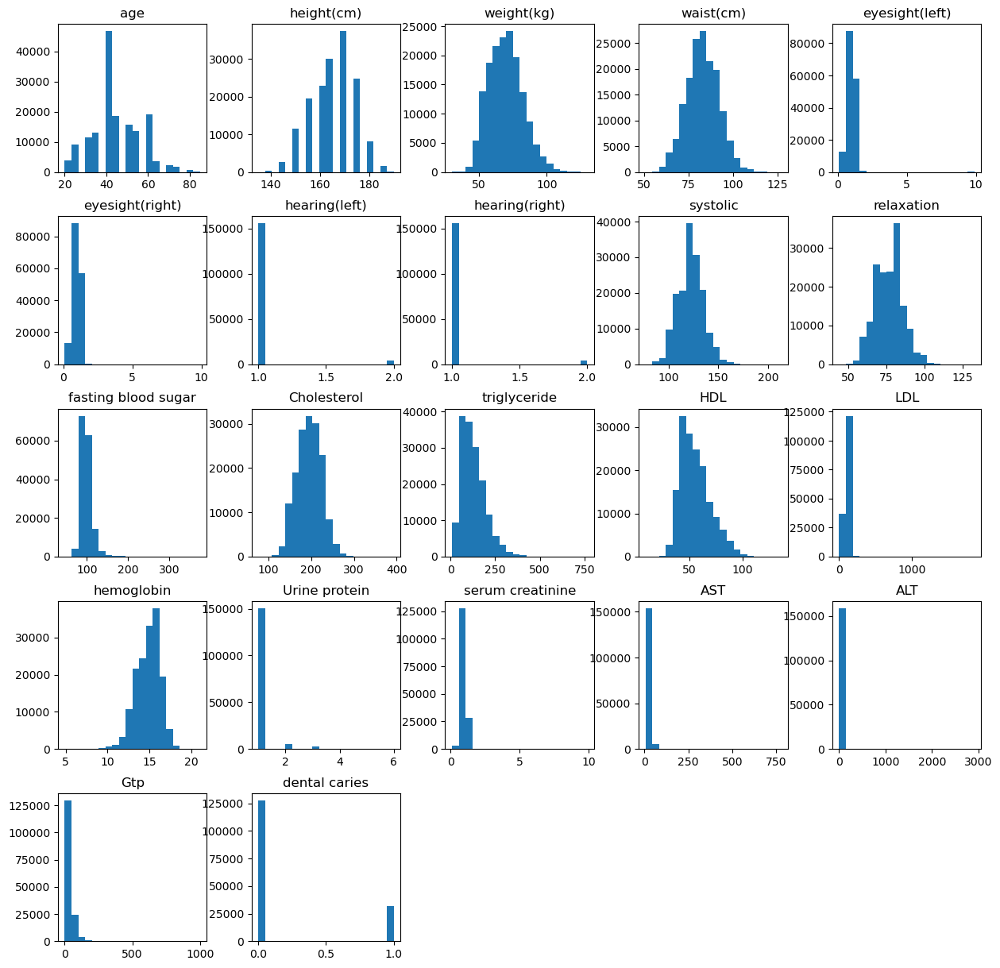


2. Violin Plot of Numerical Features by Smoking Status


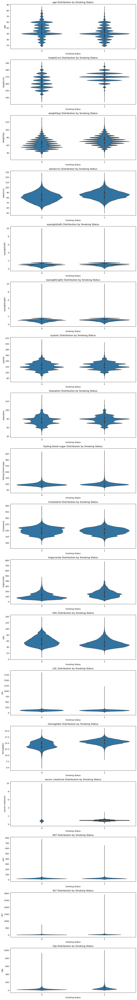

In [3]:
print("FEATURE DISTRIBUTION ANALYSIS:\n")

print("\n1. Histogram of each feature")
x.hist(figsize=(15, 15), bins=20, grid=False)
plt.show()

# Describing print("\n2. Boxplot of each feature")
# Describing x.plot(kind='box', subplots=True, layout=(4, 6), figsize=(15, 15))
# Describing plt.show()

cat_x = ["hearing(left)", "hearing(right)", "Urine protein", "dental caries"]
num_x = [col for col in x.columns if col not in cat_x]

print("\n2. Violin Plot of Numerical Features by Smoking Status")
n_rows = len(num_x)

fig, axs = plt.subplots(n_rows, 1, figsize=(10, 4 * n_rows))
sns.set_palette("Set3")

for i, col in enumerate(num_x):
    sns.violinplot(x=y, y=col, data=x, ax=axs[i])
    axs[i].set(title=f'{col} Distribution by Smoking Status', xlabel='Smoking Status', ylabel=col)

plt.tight_layout()
plt.show()

# Observations and Inferences:

1. **Histograms**:
    - Most features show distinct distribution shapes across smoking and non-smoking groups.
    - For example, **triglycerides** and **LDL** have higher average values in the smoking group, suggesting a potential association between smoking and elevated lipid levels.
    - **Hemoglobin** levels appear slightly higher in smokers, which could indicate potential physiological adaptations or conditions.

2. **Box Plots(inside violin)**:
    - Outliers are prominent in features like **ALT**, **AST**, and **triglycerides** in both groups but tend to be more extreme in the smoking group, suggesting greater variability in liver enzyme levels for smokers.
    - **Systolic** and **relaxation** (diastolic) blood pressures have a wider spread in the smoking group, hinting that smoking might correlate with blood pressure variability or hypertension risk.
    
3. **Violin Plots**:
    - Features like **Cholesterol**, **LDL**, and **Gtp** have visibly higher densities and spread for smokers, suggesting these health metrics are often elevated in smoking individuals.
    - The distribution of **eyesight (left and right)** shows greater impairment density among smokers, possibly indicating lifestyle effects on sensory health.

# **Outlier Capping**

## **Methods Used:**

### 1. **Domain-Based Capping**

- **Method**: Setting fixed bounds based on typical ranges for physical and health-related features.
- **Used For**: `Height (cm)`, `Systolic Blood Pressure`, `Diastolic Blood Pressure`, `HDL`, `Hemoglobin`.
- **Reasoning**: These features have medically established ranges, so domain-based capping keeps values realistic without affecting the core data distribution.

### 2. **IQR-Based Capping**

- **Method**: Using the Interquartile Range to identify and cap outliers beyond a set factor (1.5 times IQR above Q3 and below Q1).
- **Used For**: `Weight (kg)`, `Waist (cm)`, `Fasting Blood Sugar`, `Cholesterol`, `Triglyceride`, `LDL`, `Serum Creatinine`, `AST`, `ALT`, `Gtp`.
- **Reasoning**: These features are often right-skewed, with possible high outliers. IQR-based capping is non-parametric and flexible, ideal for managing health indicators prone to extreme values.

### 3. **Range-Based Capping**

- **Method**: Defining an acceptable value range, particularly for limited-scale measurements like eyesight.
- **Used For**: `Eyesight (left)`, `Eyesight (right)`.
- **Reasoning**: These features are likely on a limited scale (e.g., 0–2), and any values beyond this are likely entry errors. Range-based capping helps preserve valid values and restricts outliers effectively.


##**Feature wise Capping details:**
| Feature                  | Outlier Handling Required | Method                      | Capping Values           | Reasoning                                                                                          |
|--------------------------|---------------------------|-----------------------------|--------------------------|----------------------------------------------------------------------------------------------------|
| Age                      | No                        | -                           | -                        | Values fall within a realistic adult range, with no significant outliers observed.                 |
| Height (cm)              | Yes                       | Domain-based capping        | 130–200 cm               | Typical adult height range; values outside may indicate data errors or rare cases.                 |
| Weight (kg)              | Yes                       | IQR-based (factor 1.5)      | -                        | Right-skewed with some high outliers; IQR capping captures excessive values effectively.           |
| Waist (cm)               | Yes                       | IQR-based (factor 1.5)      | -                        | Right-skewed with high values; IQR capping controls extreme sizes while preserving spread.         |
| Eyesight (left)          | Yes                       | Range-based capping         | 0–2                      | Some extreme values observed; limit values to typical range (0–2).                                 |
| Eyesight (right)         | Yes                       | Range-based capping         | 0–2                      | Similar to `eyesight(left)`; limit values to 0–2.                                                  |
| Hearing (left)           | No                        | -                           | -                        | Binary (1 for normal, 2 for impaired); no outlier treatment required.                              |
| Hearing (right)          | No                        | -                           | -                        | Binary (1 for normal, 2 for impaired); no outlier treatment required.                              |
| Systolic Blood Pressure  | Yes                       | Domain-based capping        | Upper cap at 180 mmHg    | Capping at hypertensive crisis level based on clinical standards from AHA.                         |
| Diastolic (Relaxation)   | Yes                       | Domain-based capping        | Upper cap at 120 mmHg    | Cap diastolic at 120 to control extreme high values indicating hypertension risk.                  |
| Fasting Blood Sugar      | Yes                       | IQR-based (factor 1.5)      | -                        | Right-skewed with high outliers; IQR capping removes excessive values conservatively.              |
| Cholesterol              | Yes                       | IQR-based or Domain-based   | 300 mg/dL max            | High outliers observed; IQR or domain cap balances natural variation and extremes.                 |
| Triglyceride             | Yes                       | IQR-based (factor 1.5)      | -                        | Right-skewed with high outliers; IQR capping effectively manages excessive values.                 |
| HDL                      | Yes                       | Domain-based capping        | Lower bound at 20 mg/dL  | Prevents unrealistic low values; typical healthy ranges start around 40 mg/dL.                     |
| LDL                      | Yes                       | IQR-based (factor 1.5)      | -                        | Right-skewed with high outliers; IQR capping limits extreme high values.                           |
| Hemoglobin               | Yes                       | Domain-based capping        | 8–20 g/dL                | 8–20 g/dL aligns with typical clinical thresholds for low and high hemoglobin.                     |
| Urine Protein            | No                        | -                           | -                        | Categorical with defined levels (0–5); no extreme values expected or observed.                     |
| Serum Creatinine         | Yes                       | IQR-based (factor 1.5)      | -                        | Right-skewed; capping manages high values while retaining renal health variability.                |
| AST                      | Yes                       | IQR-based (factor 1.5)      | -                        | Right-skewed liver enzyme with high values; IQR capping controls extremes effectively.             |
| ALT                      | Yes                       | IQR-based (factor 1.5)      | -                        | Similar to AST; IQR capping handles high outliers in liver enzyme levels.                          |
| Gtp                      | Yes                       | IQR-based or Domain-based   | -                        | Right-skewed; IQR or domain cap limits extreme values for liver enzyme measurements.               |
| Dental Caries            | No                        | -                           | -                        | Binary (0 for absence, 1 for presence); no outlier treatment necessary.                            |



## Implementation:

In [4]:
def cap_domain_based(column, lower=None, upper=None):
    if lower is not None:
        x[column] = x[column].apply(lambda v: max(v, lower))
    if upper is not None:
        x[column] = x[column].apply(lambda v: min(v, upper))

def cap_iqr_based(column, factor=1.5):
    Q1 = x[column].quantile(0.25)
    Q3 = x[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    x[column] = x[column].apply(lambda v: max(min(v, upper_bound), lower_bound))

def cap_range_based(column, lower, upper):
    x[column] = x[column].apply(lambda v: max(min(v, upper), lower))


#Domain-Based Capping
cap_domain_based('height(cm)', lower=130, upper=200)
cap_domain_based('systolic', upper=180)
cap_domain_based('relaxation', upper=120)
cap_domain_based('HDL', lower=20)
cap_domain_based('hemoglobin', lower=8, upper=20)

#IQR-Based Capping
iqr_columns = ['weight(kg)', 'waist(cm)', 'fasting blood sugar', 'Cholesterol', 'triglyceride',
               'LDL', 'serum creatinine', 'AST', 'ALT', 'Gtp']
for col in iqr_columns:
    cap_iqr_based(col, factor=1.5)

#Range-Based Capping
cap_range_based('eyesight(left)', lower=0, upper=2)
cap_range_based('eyesight(right)', lower=0, upper=2)

temp_table= x.describe(include = 'all')
display_table(temp_table,"Statistics sumary for each feature:\n" )

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries
count,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000
mean,44.306626,165.266929,67.067903,82.985894,0.999250,0.995185,1.023974,1.023421,122.501953,76.873970,97.343121,195.769365,126.819165,55.852765,114.489777,14.797534,1.074233,0.891970,25.102530,25.746999,33.731841,0.197996
std,11.842286,8.818970,12.365353,8.904865,0.311292,0.310511,0.152969,0.151238,12.720510,8.994099,11.115196,28.280541,63.707227,13.963903,25.853617,1.428177,0.347856,0.172688,7.171154,12.465921,20.198613,0.398490
min,20.000000,135.000000,37.500000,59.000000,0.100000,0.100000,1.000000,1.000000,77.000000,44.000000,70.500000,112.000000,8.000000,20.000000,38.000000,8.000000,1.000000,0.500000,6.500000,1.000000,2.000000,0.000000
25%,40.000000,160.000000,60.000000,77.000000,0.800000,0.800000,1.000000,1.000000,114.000000,70.000000,90.000000,175.000000,77.000000,45.000000,95.000000,13.800000,1.000000,0.800000,20.000000,16.000000,18.000000,0.000000
50%,40.000000,165.000000,65.000000,83.000000,1.000000,1.000000,1.000000,1.000000,121.000000,78.000000,96.000000,196.000000,115.000000,54.000000,114.000000,15.000000,1.000000,0.900000,24.000000,22.000000,27.000000,0.000000
75%,55.000000,170.000000,75.000000,89.000000,1.200000,1.200000,1.000000,1.000000,130.000000,82.000000,103.000000,217.000000,165.000000,64.000000,133.000000,15.800000,1.000000,1.000000,29.000000,32.000000,44.000000,0.000000
max,85.000000,190.000000,97.500000,107.000000,2.000000,2.000000,2.000000,2.000000,180.000000,120.000000,122.500000,280.000000,297.000000,136.000000,190.000000,20.000000,6.000000,1.300000,42.500000,56.000000,83.000000,1.000000


## Results:

1. **Reduction in Extreme Values**: Capping successfully removed outliers across several features, especially in right-skewed health metrics, such as `Triglyceride`, `Gtp`, `Fasting Blood Sugar`, and `AST/ALT`.

2. **Stabilized Mean and Spread**: For most capped features, the mean and standard deviation decreased slightly, indicating a reduced influence of extreme values. This stabilization should make the dataset more representative of general health patterns rather than rare outlier conditions.

3. **Maintained Central Tendency**: For features without extreme skewness, like `height(cm)`, `systolic`, and `relaxation`, capping had minimal impact on mean and standard deviation, preserving the original data distribution.

4. **Improved Data Quality for Modeling**: By reducing variability in features with high outliers, the dataset is now more balanced, which can enhance model training and improve generalization to new data.

## Summary of changes:
| Feature               | Mean Change | Std Dev Change | Max Change         | Inference                                                                                      |
|-----------------------|-------------|----------------|--------------------|------------------------------------------------------------------------------------------------|
| **Age**               | None        | None           | None               | No outliers capped; mean and spread remained stable.                                           |
| **Height (cm)**       | None        | None           | None               | Capping had minimal effect, as height had no extreme outliers.                                 |
| **Weight (kg)**       | Slight ↓    | Slight ↓       | Reduced to 97.5 kg | Right-skewed; high outliers capped, slightly lowering mean and reducing variability.           |
| **Waist (cm)**        | Slight ↓    | Slight ↓       | Reduced to 107 cm  | Right-skewed; high outliers capped, mean and spread slightly reduced.                          |
| **Eyesight (left)**   | Slight ↓    | Significant ↓  | Reduced to 2.0     | Capped extreme values, especially errors above 2.0, reducing mean and variability.             |
| **Eyesight (right)**  | Slight ↓    | Significant ↓  | Reduced to 2.0     | Similar to `eyesight(left)`, capping improbable values, reducing mean and spread.              |
| **Hearing (left)**    | None        | None           | None               | Binary data; no capping applied.                                                               |
| **Hearing (right)**   | None        | None           | None               | Binary data; no capping applied.                                                               |
| **Systolic BP**       | None        | None           | Reduced to 180     | Capping removed extreme high values, keeping distribution within realistic bounds.             |
| **Diastolic BP**      | None        | None           | Reduced to 120     | High outliers removed, keeping values in realistic health ranges for diastolic BP.             |
| **Fasting Blood Sugar** | Slight ↓ | Significant ↓  | Reduced to 122.5   | High diabetic outliers capped, reducing mean and spread, resulting in a more typical range.    |
| **Cholesterol**       | Minimal ↓   | Slight ↓       | Reduced to 280     | High values capped, slightly lowering mean, keeping values within realistic cholesterol levels.|
| **Triglyceride**      | Slight ↓    | Moderate ↓     | Reduced to 297     | Capped high values in this right-skewed feature, reducing mean and spread.                     |
| **HDL**               | None        | None           | Lower capped to 20 | Minimal impact, capping low values only; mean and spread remained stable.                      |
| **LDL**               | Minimal ↓   | Slight ↓       | Reduced to 190     | High outliers capped, slightly lowering mean, keeping typical LDL values.                      |
| **Hemoglobin**        | None        | Minimal ↓      | Upper bound 20     | Minimal changes, as most values were within the range; small reduction in spread.              |
| **Urine Protein**     | None        | None           | None               | Categorical feature; no capping applied.                                                       |
| **Serum Creatinine**  | Slight ↓    | Slight ↓       | Reduced to 1.3     | High values capped, reducing mean and spread, focusing on realistic renal health indicators.   |
| **AST**               | Moderate ↓  | Moderate ↓     | Reduced to 42.5    | High liver enzyme values capped, leading to a lower mean and spread in right-skewed data.      |
| **ALT**               | Moderate ↓  | Moderate ↓     | Reduced to 56.0    | Similar to AST; capping reduced high outliers, lowering mean and variability.                  |
| **Gtp**               | Moderate ↓  | Significant ↓  | Reduced to 83      | High outliers capped significantly, reducing mean and spread, bringing data to a more typical range. |
| **Dental Caries**     | None        | None           | None               | Binary data; no capping applied.                                                               |


### **Analysis of Categorical Features:**

1. **`hearing(left)` and `hearing(right)`**:
    - **Data Type**: `int64`
    - **Unique Values**: 2 (likely binary, such as 1 = Normal, 2 = Impaired)
    - **Encoding Requirement**: **No one-hot encoding needed**. Since these are binary features, they can be used directly without additional encoding. Most models can interpret binary features without further transformation.
2. **`Urine protein`**:
    - **Data Type**: `int64`
    - **Unique Values**: 6
    - **Encoding Requirement**: **One-hot encoding recommended**. This feature has six unique levels, indicating it’s likely categorical but with more than two distinct values. One-hot encoding will allow models to interpret each level individually.
3. **`dental caries`**:
    - **Data Type**: `int64`
    - **Unique Values**: 2 (likely binary, such as 0 = No Caries, 1 = Has Caries)
    - **Encoding Requirement**: **No one-hot encoding needed**. This feature is binary and can be used directly as-is.

### Conclusion

- **One-Hot Encoding Needed Only for `Urine protein`**: Since this feature has more than two levels, one-hot encoding will help models interpret each level distinctly.
- **Binary Features `hearing(left)`, `hearing(right)`, and `dental caries`** do not require one-hot encoding as they only contain two unique values.

## **Encoding Categorical Variables:**

In [5]:
x = pd.get_dummies(x, columns=cat_x, drop_first=True)
binary_columns = [col for col in x.columns if x[col].dtype == 'bool']
x[binary_columns] = x[binary_columns].astype(int)
display_table(x.head(),"First few rows after encoding\n" )

x = x.rename(columns={
    'hearing(left)_2': 'hearing(left)',
    'hearing(right)_2': 'hearing(right)',
    'dental caries_1': 'dental caries'
})

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,serum creatinine,AST,ALT,Gtp,hearing(left)_2,hearing(right)_2,Urine protein_2,Urine protein_3,Urine protein_4,Urine protein_5,Urine protein_6,dental caries_1
0,55,165,60.000000,81.000000,0.500000,0.600000,135,87,94.000000,172.000000,297.000000,40,75.000000,16.500000,1.000000,22.000000,25.000000,27.000000,0,0,0,0,0,0,0,0
1,70,165,65.000000,89.000000,0.600000,0.700000,146,83,122.500000,194.000000,55.000000,57,126.000000,16.200000,1.100000,27.000000,23.000000,37.000000,1,1,0,0,0,0,0,1
2,20,170,75.000000,81.000000,0.400000,0.500000,118,75,79.000000,178.000000,197.000000,45,93.000000,17.400000,0.800000,27.000000,31.000000,53.000000,0,0,0,0,0,0,0,0
3,35,180,95.000000,105.000000,1.500000,1.200000,131,88,91.000000,180.000000,203.000000,38,102.000000,15.900000,1.000000,20.000000,27.000000,30.000000,0,0,0,0,0,0,0,1
4,30,165,60.000000,80.500000,1.500000,1.000000,121,76,91.000000,155.000000,87.000000,44,93.000000,15.400000,0.800000,19.000000,13.000000,17.000000,0,0,0,0,0,0,0,0


#**Feature Selection:**

In [6]:
corr = x.corr()
corr.style.background_gradient(cmap='coolwarm')

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,serum creatinine,AST,ALT,Gtp,hearing(left),hearing(right),Urine protein_2,Urine protein_3,Urine protein_4,Urine protein_5,Urine protein_6,dental caries
age,1.000000,-0.489608,-0.337463,-0.044389,-0.367520,-0.365689,0.160514,0.064928,0.217122,0.107230,-0.037728,0.041409,0.114040,-0.281495,-0.154657,0.055998,-0.154262,-0.070271,0.212889,0.212972,-0.045900,0.017177,0.011408,0.010489,0.002519,-0.120556
height(cm),-0.489608,1.000000,0.690794,0.410245,0.276238,0.280449,0.062341,0.114401,0.026691,-0.113600,0.256224,-0.303460,-0.086623,0.569577,0.475966,0.064853,0.279394,0.296949,-0.090110,-0.091760,0.004260,-0.020913,-0.005438,-0.000157,-0.007146,0.100585
weight(kg),-0.337463,0.690794,1.000000,0.829506,0.200202,0.205423,0.242085,0.266471,0.161709,0.020975,0.393993,-0.442019,0.066555,0.532410,0.410432,0.181166,0.462753,0.400209,-0.070154,-0.071043,-0.030851,-0.019509,0.000591,0.002226,-0.005163,0.090967
waist(cm),-0.044389,0.410245,0.829506,1.000000,0.056855,0.062314,0.306542,0.291585,0.246823,0.075567,0.402844,-0.450719,0.127027,0.419909,0.304214,0.216276,0.446350,0.397496,0.004985,0.006919,-0.042313,-0.013133,0.001682,0.003947,-0.003494,0.053481
eyesight(left),-0.367520,0.276238,0.200202,0.056855,1.000000,0.704472,-0.046618,0.011252,-0.063835,-0.015476,0.072679,-0.051372,-0.024760,0.174359,0.116283,-0.000770,0.106962,0.080487,-0.101978,-0.107675,0.016907,-0.019567,-0.017918,-0.008278,0.001001,0.031913
eyesight(right),-0.365689,0.280449,0.205423,0.062314,0.704472,1.000000,-0.040457,0.019953,-0.058699,-0.011182,0.081591,-0.056770,-0.021776,0.180654,0.118954,0.004031,0.113555,0.090287,-0.101689,-0.109742,0.017082,-0.016955,-0.018060,-0.005202,0.002072,0.036397
systolic,0.160514,0.062341,0.242085,0.306542,-0.046618,-0.040457,1.000000,0.753157,0.215097,0.069057,0.162577,-0.116536,0.058130,0.175147,0.067570,0.109128,0.140202,0.195532,0.041937,0.041764,-0.048085,-0.013686,0.008686,0.006341,-0.001127,0.018094
relaxation,0.064928,0.114401,0.266471,0.291585,0.011252,0.019953,0.753157,1.000000,0.186767,0.100289,0.197901,-0.127235,0.080440,0.230736,0.095132,0.107343,0.163749,0.231004,-0.011738,-0.015247,-0.033606,-0.010671,0.005674,0.008790,-0.003213,0.023922
fasting blood sugar,0.217122,0.026691,0.161709,0.246823,-0.063835,-0.058699,0.215097,0.186767,1.000000,0.052667,0.206454,-0.143906,0.032613,0.109592,0.079001,0.057929,0.122916,0.207796,0.026560,0.027819,-0.044277,-0.000019,0.017909,0.007919,-0.004377,0.006906
Cholesterol,0.107230,-0.113600,0.020975,0.075567,-0.015476,-0.011182,0.069057,0.100289,0.052667,1.000000,0.238608,0.165938,0.876350,0.031740,-0.005673,0.070906,0.094127,0.126558,-0.029346,-0.029228,-0.029689,-0.019504,-0.003673,-0.002441,0.000122,-0.024952


## Dropping waist(cm):

waist(cm) and weight(kg) have a high correlation coefficient of 0.83, indicating that they contain overlapping information.


**Reasoning:** We chose to keep weight(kg) over waist(cm) because weight is a more commonly used metric that generally captures a broader range of health information in various models and research.


## Dropping LDL:

LDL and Cholesterol have a correlation of 0.88, meaning that much of the variance in LDL is already captured by Cholesterol.


**Reasoning:** We kept Cholesterol over LDL since Cholesterol includes both LDL and HDL information, making it a more comprehensive health metric for our classification tasks.

In [7]:
feature_variances = x.var()
variance_df = pd.DataFrame(feature_variances, columns=['Variance']).sort_values(by='Variance')
display_table(variance_df, "Variance of Each Feature:")

,Variance
Urine protein_6,0.000038
Urine protein_5,0.000464
Urine protein_4,0.002986
Urine protein_3,0.013794
hearing(right),0.022873
hearing(left),0.023399
serum creatinine,0.029821
Urine protein_2,0.033980
eyesight(right),0.096417
eyesight(left),0.096903


Based on this analysis, features with very low variance:

- **Urine protein Categories**: `Urine protein_6`, `Urine protein_5`, `Urine protein_4`, and `Urine protein_3`

- **Hearing Categories**: `hearing(left)` and `hearing(right)`

But they are derived from "Categorical Variables" so wont be dropped.


### Dropping:

In [8]:
features_to_drop = [ 'waist(cm)', 'LDL']

x_dropped = x.drop(columns=features_to_drop)

display_table(x_dropped.head(), "Dataset after Dropping Low-Variance and Highly Correlated Features")

,age,height(cm),weight(kg),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,hemoglobin,serum creatinine,AST,ALT,Gtp,hearing(left),hearing(right),Urine protein_2,Urine protein_3,Urine protein_4,Urine protein_5,Urine protein_6,dental caries
0,55,165,60.000000,0.500000,0.600000,135,87,94.000000,172.000000,297.000000,40,16.500000,1.000000,22.000000,25.000000,27.000000,0,0,0,0,0,0,0,0
1,70,165,65.000000,0.600000,0.700000,146,83,122.500000,194.000000,55.000000,57,16.200000,1.100000,27.000000,23.000000,37.000000,1,1,0,0,0,0,0,1
2,20,170,75.000000,0.400000,0.500000,118,75,79.000000,178.000000,197.000000,45,17.400000,0.800000,27.000000,31.000000,53.000000,0,0,0,0,0,0,0,0
3,35,180,95.000000,1.500000,1.200000,131,88,91.000000,180.000000,203.000000,38,15.900000,1.000000,20.000000,27.000000,30.000000,0,0,0,0,0,0,0,1
4,30,165,60.000000,1.500000,1.000000,121,76,91.000000,155.000000,87.000000,44,15.400000,0.800000,19.000000,13.000000,17.000000,0,0,0,0,0,0,0,0


# **Scaling Numerical Features:**

* Useing `StandardScaler()` for scaling your dataset before applying KNN, SVM, Naive Bayes on PCA, and LDA transformed data.

* sThis choice balances the benefits of feature scaling across multiple models and transformations, retains meaningful spread for PCA/LDA, and is less affected by outliers due to the prior capping step.

### Implementaion:


In [9]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

#initializing the StandardScaler and fitting it
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

x_train_scaled = pd.DataFrame(x_train_scaled, columns=x.columns)
x_test_scaled = pd.DataFrame(x_test_scaled, columns=x.columns)

display_table(x_train_scaled.head(), "First few rows of scaled training data")
display_table(x_test_scaled.head(), "First few rows of scaled testing data")

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,serum creatinine,AST,ALT,Gtp,hearing(left),hearing(right),Urine protein_2,Urine protein_3,Urine protein_4,Urine protein_5,Urine protein_6,dental caries
0,-0.363764,-1.729695,-1.379748,-0.333442,-1.603882,-1.594554,-0.194344,0.127142,0.419919,-0.592603,-1.235490,0.296176,-0.212467,-2.095643,-1.691029,-1.546100,-1.181997,-1.223964,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426
1,1.750195,-1.729695,-1.379748,-1.570382,-0.961583,0.015501,1.299974,1.348592,2.262515,0.503020,-0.451119,0.797405,0.290458,1.054513,-1.691029,-1.128397,-0.138558,-0.430758,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426
2,0.904612,-1.162983,-0.974731,-0.333442,0.644164,0.659523,-1.059475,-0.650144,-0.748556,-1.476170,-1.282553,-0.563073,-0.715392,-0.975587,-1.691029,-0.849928,-0.860939,-0.876936,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426
3,0.904612,-0.596270,-0.569714,0.003905,-0.961583,-0.628521,0.592139,0.349224,-0.748556,1.209874,-0.686430,-0.133449,1.721860,-0.135546,-1.111963,-1.546100,-1.021468,-0.381182,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426
4,-1.209348,1.670580,1.860389,1.353294,0.001865,0.659523,-0.194344,0.571306,-0.928322,-1.158086,-0.153057,-0.133449,-1.102257,-0.695574,0.046169,-0.014522,0.343030,-0.629059,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426


,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,serum creatinine,AST,ALT,Gtp,hearing(left),hearing(right),Urine protein_2,Urine protein_3,Urine protein_4,Urine protein_5,Urine protein_6,dental caries
0,-0.786556,1.103867,1.050355,0.116354,-0.640433,0.015501,-0.037047,-0.761185,0.240154,-0.274519,1.745122,-0.849490,-0.715392,0.844503,-1.111963,0.820883,-0.299087,-0.083730,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426
1,-0.786556,2.237292,1.050355,0.566150,0.644164,0.659523,-1.767310,-1.427430,-0.478908,-1.476170,-0.074620,-0.491469,-1.334377,0.144468,0.046169,-0.432225,-0.299087,-0.827361,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426
2,-2.054932,-0.596270,-0.569714,-0.783239,0.644164,0.659523,0.592139,0.904428,-0.658673,-0.062463,0.113629,-1.565531,0.754697,1.474534,-0.532897,-0.153757,0.503559,0.362449,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,2.010351
3,1.327404,-1.162983,-0.569714,0.543660,-0.961583,-2.560587,-0.272992,-1.649512,-0.568791,2.305497,-0.372681,1.227029,2.031353,-1.115594,0.046169,-0.571460,-0.780674,-0.976087,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426
4,1.327404,-0.029558,0.240320,0.228803,-0.640433,-1.272543,1.535919,1.792755,0.959216,-0.592603,-0.278557,-0.491469,-0.251153,0.494485,-1.111963,0.263946,1.145675,1.353958,-0.156031,-0.154653,-0.191788,-0.119069,-0.054260,-0.022065,-0.006863,-0.497426


## **Linear Discriminant Analysis**

In [10]:
#initialize LDA with 1 component for binary classification
lda = LDA(n_components=1)

#fit LDA on the training set and transform both train and test sets
x_train_lda = lda.fit_transform(x_train_scaled, y_train)
x_test_lda = lda.transform(x_test_scaled)

x_train_lda = pd.DataFrame(x_train_lda, columns=['LDA Component'])
x_test_lda = pd.DataFrame(x_test_lda, columns=['LDA Component'])

print("LDA-transformed Train Shape:", x_train_lda.shape)
print("LDA-transformed Test Shape:", x_test_lda.shape)

LDA-transformed Train Shape: (127404, 1)
LDA-transformed Test Shape: (31852, 1)


/var/folders/cy/wgjwzh1n2972lh_2nybh6rhc0000gn/T/ipykernel_1285/3827977321.py:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Class')


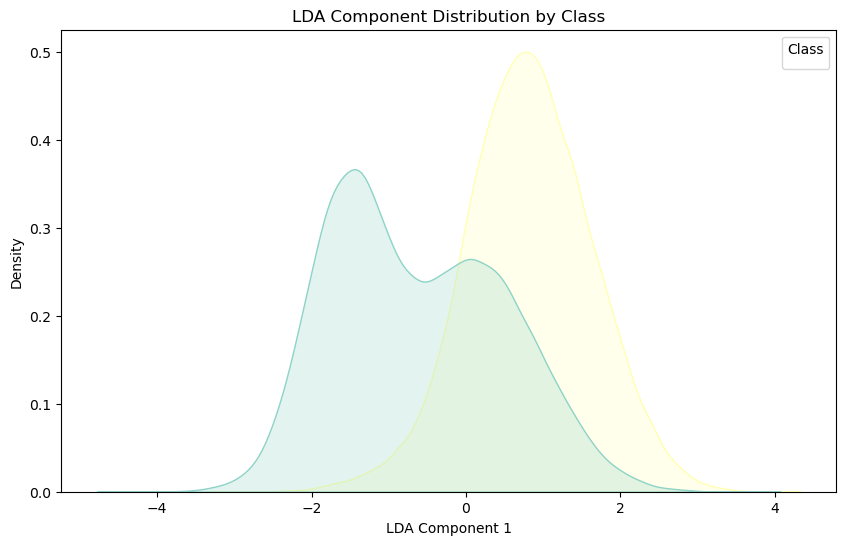

In [11]:
lda_df = pd.DataFrame({
    'LDA1': x_train_lda['LDA Component'].values,
    'Class': y_train.reset_index(drop=True)
})

plt.figure(figsize=(10, 6))
sns.kdeplot(data=lda_df, x='LDA1', hue='Class', fill=True, common_norm=False)
plt.title('LDA Component Distribution by Class')
plt.xlabel('LDA Component 1')
plt.ylabel('Density')
plt.legend(title='Class')
plt.show()

# Inference

The plot above shows the distribution of classes in the 1D space produced by LDA. As a supervised dimensionality reduction technique, LDA is designed to maximize class separability but is limited to producing only C - 1 components, where C is the number of classes. Since this is a binary classification problem, LDA has reduced the data to a single dimension.

In the plot, there is some separation between the classes, but it’s not distinct enough to confidently classify instances with high accuracy. The overlap between the classes suggests that a single LDA component may not adequately capture the complex relationships in the data.

Reducing our dataset to only one dimension results in a significant loss of information. Therefore, using LDA for this dataset may not yield optimal results in terms of classification performance.

**Conclusion:** Since LDA is not providing sufficient separation in this 1D space, we will proceed with PCA. Unlike LDA, PCA is an unsupervised technique and allows us to select multiple principal components. This will enable us to retain more information by choosing a higher-dimensional representation, potentially allowing for better class separation.

# **Principle Component Analysis**

<Figure size 1800x1000 with 0 Axes>

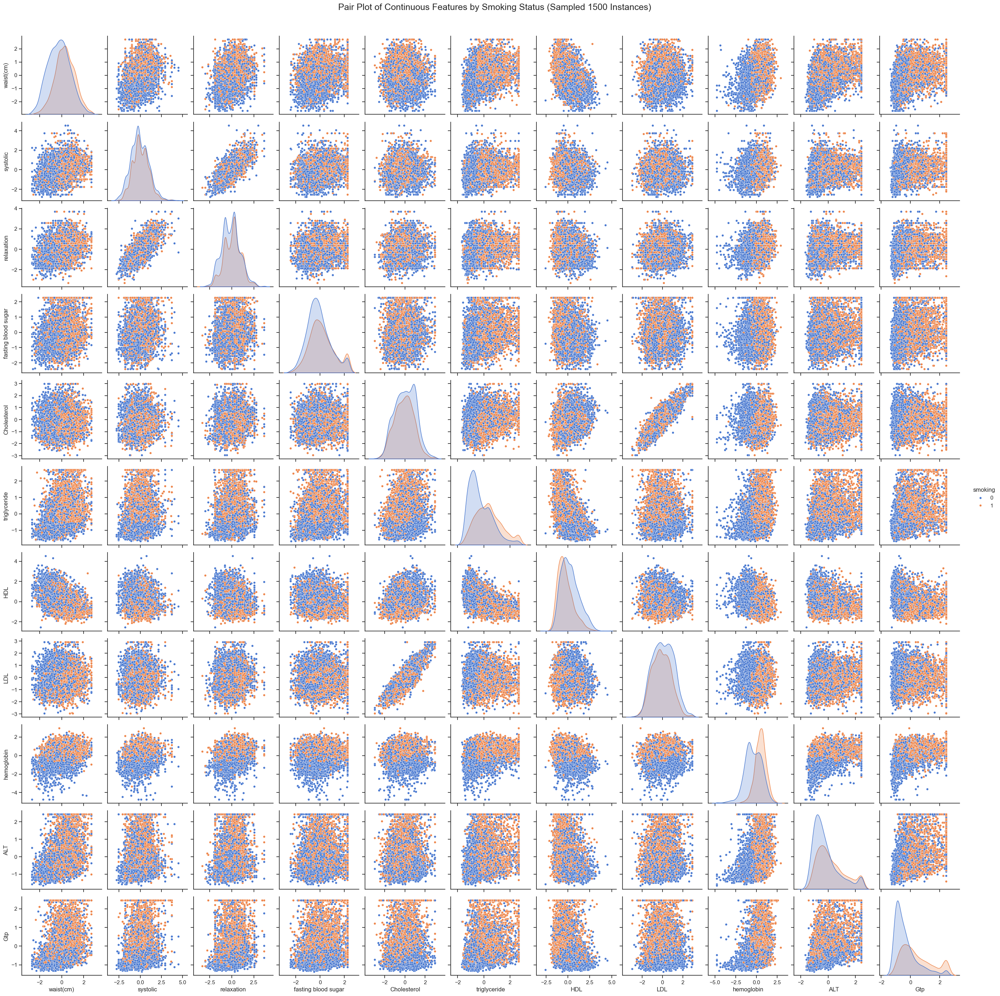

In [12]:
pair_plot_cols = [col for col in x_train_scaled.columns if x_train_scaled[col].nunique() > 50]

#adding the 'smoking' column for visualization
x_train_scaled['smoking'] = y_train.reset_index(drop=True)
sampled_data = x_train_scaled.sample(n=5555, random_state=42)

#creating the pair plot with KDE on the diagonal
sns.set(font_scale=1)
plt.figure(figsize=(18, 10))
sns.set(style="ticks", color_codes=True)
sns.pairplot(data=sampled_data, vars=pair_plot_cols, diag_kind='kde', kind='scatter', palette='muted', plot_kws={'s': 20}, hue='smoking')
plt.suptitle("Pair Plot of Continuous Features by Smoking Status (Sampled 1500 Instances)", y=1.02, fontsize=18)
plt.show()

#removing 'smoking' column from x_train_scaled after visualization
x_train_scaled = x_train_scaled.drop(columns=['smoking'])

Hemoglobin shows most seperation in combination with other features

## Applying PCA to find out ideal ideal no of components to pick to get maximum varience to computation power ratio

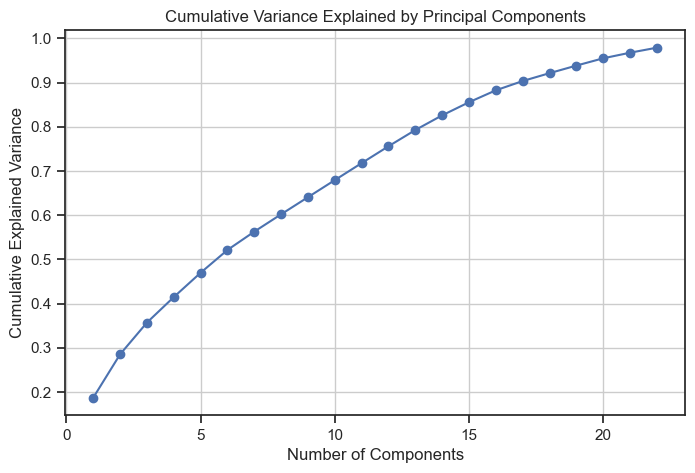

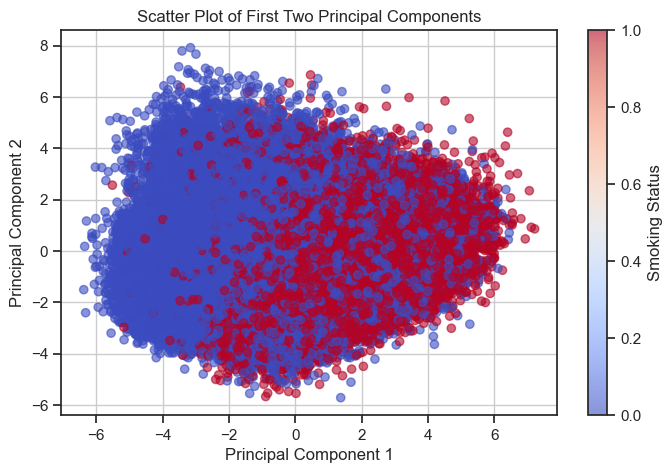

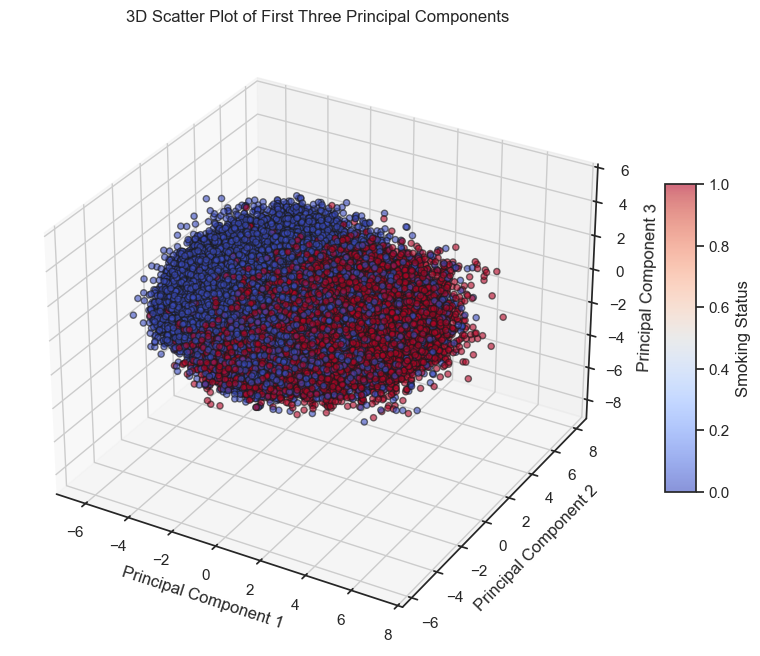

In [13]:
# initializing PCA, aiming to capture up to 90% of variance
pca = PCA(n_components=.975)
x_train_pca = pca.fit_transform(x_train_scaled)
x_test_pca = pca.transform(x_test_scaled)

# plotting cumulative variance explained by each component
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1),
         pca.explained_variance_ratio_.cumsum(), marker='o')
plt.title('Cumulative Variance Explained by Principal Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()
print("\n")

# Visualising scatter plot for the first two principal components 2d
plt.figure(figsize=(8, 5))
plt.scatter(x_train_pca[:, 0], x_train_pca[:, 1], c=y_train, cmap='coolwarm', alpha=0.6)
plt.title('Scatter Plot of First Two Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Smoking Status')
plt.grid(True)
plt.show()
print("\n")

# Visualising scatter plot for the first two principal components 3d
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(x_train_pca[:, 0], x_train_pca[:, 1], x_train_pca[:, 2], c=y_train, cmap='coolwarm', alpha=0.6, edgecolor='k')

ax.set_title('3D Scatter Plot of First Three Principal Components')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
color_bar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=10)
color_bar.set_label('Smoking Status')
plt.show()

# **Inference**

**Variance-Number of Components Plot**:
* The cumulative explained variance plot shows how much variance is captured by each additional principal component. The "elbow" shape in this plot typically indicates the point of diminishing returns, where adding more components yields progressively less additional variance.

* In our case, the elbow appears around 15-18 components. We examined the range between 85% and 95% cumulative variance, as this range offers a balance between dimensionality reduction and information retention. By retaining components in this range, we simplify our data while preserving a high level of variance (information), which is crucial for model accuracy.

**2D and 3D Scatter Plots**:
*  The scatter plots of the first two and three principal components provide a visual sense of how the smoking and non-smoking classes are distributed in the reduced feature space. Although there is some overlap between the classes, these plots reveal noticeable clusters, especially in the 2D plot.

* The 3D scatter plot adds another layer of separation, though still not completely distinct. These visualizations indicate that the PCA-transformed components carry useful information for separating the classes but also highlight the inherent complexity of the data.

In [14]:
cumulative_variance = pca.explained_variance_ratio_.cumsum()
filtered_components = []
filtered_variances = []

for i, var in enumerate(cumulative_variance):
    if 0.85 <= var <= 0.95:
        filtered_components.append(i + 1)  # Component numbers start from 1
        filtered_variances.append(var)

filtered_variance_df = pd.DataFrame({
    "Number of Components": filtered_components,
    "Cumulative Explained Variance": filtered_variances
})

display_table(filtered_variance_df, title="Components with 85% to 95% Cumulative Explained Variance")

,Number of Components,Cumulative Explained Variance
0,15,0.855464
1,16,0.882441
2,17,0.903392
3,18,0.921201
4,19,0.938355


Based on the table, **18 components capture roughly 92% of the variance**, offering a good balance of reduced dimensionality and high information retention. This choice keeps most of the dataset’s structure while simplifying the model.

## Final PCA and dataset linear trasformation

In [15]:
X_train, X_val, Y_train, Y_val = train_test_split(x_train_scaled, y_train, test_size=0.25, random_state=42)
X_test,Y_test = x_test_scaled, y_test

pca = PCA(n_components=18)
x_train_pca = pca.fit_transform(X_train)
x_val_pca = pca.transform(X_val)
x_test_pca = pca.transform(X_test)

x_train_pca = pd.DataFrame(x_train_pca, columns=[f'PC{i+1}' for i in range(18)])
x_val_pca = pd.DataFrame(x_val_pca, columns=[f'PC{i+1}' for i in range(18)])
x_test_pca = pd.DataFrame(x_test_pca, columns=[f'PC{i+1}' for i in range(18)])

display_table(x_train_pca.head(), "First few rows of PCA-transformed training data")
display_table(x_val_pca.head(), "First few rows of PCA-transformed validation data")
display_table(x_test_pca.head(), "First few rows of PCA-transformed testing data")
print("PCA-Transformed Train Shape:", x_train_pca.shape)
print("PCA-Transformed Validation Shape:", x_val_pca.shape)
print("PCA-Transformed Test Shape:", x_test_pca.shape)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
0,0.260937,-1.132391,2.245158,-0.974282,1.011730,0.378752,0.015195,1.618452,0.175098,-0.095749,0.090949,0.037010,0.134443,-0.186060,0.640716,-0.466052,0.558742,-0.554632
1,0.923046,-0.261183,-0.340531,1.576891,1.247737,-1.692859,-0.161344,-2.903824,3.558573,0.061637,-0.553791,-2.030753,1.958252,1.382977,0.244698,0.386919,-0.197607,0.883023
2,0.524044,-1.310632,-0.377185,1.398473,-0.287721,1.575955,-0.030186,-0.900632,-0.233346,0.476402,0.077668,-0.697922,-0.834132,0.875358,-0.212807,0.822184,-1.477608,-0.129550
3,-1.397927,0.901753,1.535227,1.751005,0.912942,-0.180676,0.012141,0.936923,0.070213,-0.053180,0.080539,0.052690,-0.100857,0.396398,-0.216131,-0.416341,-1.400036,-0.456007
4,1.099233,-2.091947,0.303892,-0.351240,0.270138,-0.084858,-0.225109,-1.750434,2.946898,-0.912129,-0.621768,0.302664,3.654540,1.770673,-0.526810,-0.904625,0.856775,1.361051


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
0,1.451328,-0.486923,-0.454075,-0.978513,-0.482152,-0.408898,0.038012,-0.120520,0.200809,0.172072,-0.011220,-0.439332,-0.574651,-0.563027,-0.188194,0.761238,-0.954867,0.283464
1,-0.291622,1.335137,-1.585145,0.755588,0.123102,-2.019507,0.111493,0.905084,0.299485,-0.004238,0.062297,-0.188370,-0.382160,0.456829,-0.207450,0.243087,0.073358,-0.444783
2,2.514561,2.235875,2.418212,-1.897225,0.350474,-1.316254,0.069451,2.137357,-5.578280,-0.218813,-2.816997,-2.399764,5.622248,1.213664,-0.695113,-0.043344,-0.241261,0.957834
3,2.391709,-0.680368,-1.035383,-1.525100,-1.274827,0.778650,0.093131,0.621567,0.311409,0.167455,-0.043620,-0.481395,-0.400703,-0.904271,0.396676,0.676502,1.764235,1.543701
4,0.436306,-2.040094,2.261738,-0.684265,1.593573,0.142522,-0.032929,0.509432,-0.109634,0.226525,0.208332,-0.328292,-0.264269,0.805513,1.645640,0.000886,-0.231817,-0.283973


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
0,1.349730,-0.517575,-0.686763,-0.463743,-0.246563,-1.042656,0.054305,0.797356,0.346452,-0.191489,0.010632,0.053483,-0.212710,-0.836172,0.029903,-1.229152,-1.033995,0.585905
1,0.614761,-3.275192,-1.325449,-0.975393,0.547072,-1.034632,0.040367,0.444255,0.154380,0.150521,0.127697,-0.353582,-0.547603,-0.312687,1.174416,-0.118440,0.077923,0.276846
2,1.137227,-0.922041,0.744942,0.722983,0.132944,0.559194,-0.105418,-0.545642,-0.565497,-0.700193,-0.196128,1.709712,0.808884,-1.082431,-1.471841,0.259179,-1.716306,-1.436795
3,-2.616032,2.457159,2.226288,-0.915295,0.602297,-1.974565,-0.013782,-0.958980,-0.120661,0.238061,0.093733,-0.293070,-0.668573,-0.016026,0.920407,0.112874,0.968173,0.717164
4,1.059408,2.435232,-1.219165,1.051890,-1.693521,0.475875,0.015637,0.108533,0.346683,-0.089996,-0.129757,-0.157610,-0.136498,-0.060888,0.103035,-0.489001,-0.178622,-1.307788


PCA-Transformed Train Shape: (95553, 18)
PCA-Transformed Validation Shape: (31851, 18)
PCA-Transformed Test Shape: (31852, 18)


# Clustering

## Finding optimal number of clusters

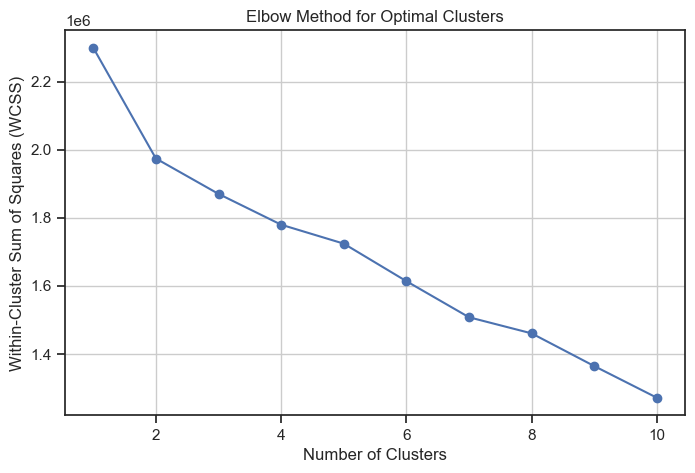

In [16]:
# wcsselbow Method for optimal number of clusters
wcss = []  # List to store within-cluster sum of squares for each k
max_clusters = 10

for i in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(x_train_pca)  
    wcss.append(kmeans.inertia_)  # Inertia = WCSS(KMeans)

#plot the WCSS to find the elbow point
plt.figure(figsize=(8, 5))
plt.plot(range(1, max_clusters + 1), wcss, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.grid(True)
plt.show()

* The Within-Cluster Sum of Squares (WCSS) decreases as the number of clusters increases, which is expected as more clusters allow for tighter grouping of data points.

* The "elbow" or point of inflection appears around 3 to 4 clusters. After 4 clusters, the reduction in WCSS becomes less significant, indicating diminishing returns for adding more clusters.

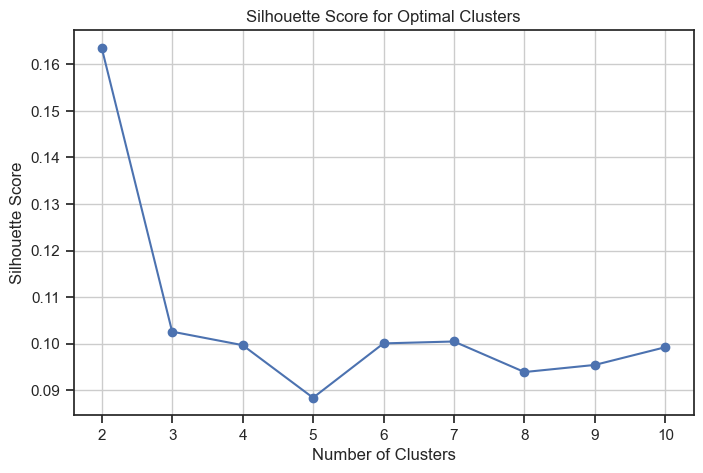

In [17]:
silhouette_scores = []  
for i in range(2, max_clusters + 1): 
    kmeans = KMeans(n_clusters=i, random_state=42)
    cluster_labels = kmeans.fit_predict(x_train_pca) 
    silhouette_avg = silhouette_score(x_train_pca, cluster_labels)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(8, 5))
plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
plt.title('Silhouette Score for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

* The Silhouette Score is highest for 2 clusters (around 0.16), which suggests better-defined clusters with that configuration.

* After 2 clusters, the Silhouette Score decreases significantly and remains relatively low and stable across cluster counts from 3 to 10. This indicates that adding more clusters beyond 2 does not result in well-separated clusters.


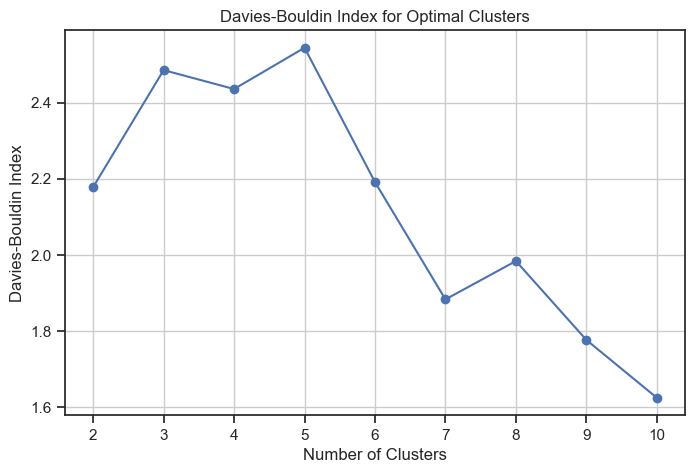

In [18]:
davies_bouldin_scores = [] 
for i in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=i, random_state=42)
    cluster_labels = kmeans.fit_predict(x_train_pca)
    db_index = davies_bouldin_score(x_train_pca, cluster_labels)
    davies_bouldin_scores.append(db_index)

plt.figure(figsize=(8, 5))
plt.plot(range(2, max_clusters + 1), davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin Index for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')
plt.grid(True)
plt.show()

* The Davies-Bouldin Index is lowest at 2 clusters and decreases again more substantially from 7 to 10 clusters, reaching the lowest point at 10 clusters.

* A lower Davies-Bouldin Index indicates better-defined clusters. While 2 clusters show relatively good separation, there’s also a downward trend starting from 7 clusters onward, suggesting potentially well-defined clusters with higher numbers.

## Conclusion: 
Given the results from these metrics, **the optimal number of clusters appears to be 2**, which consistently aligns across all three metrics. This aligns with the intuition that two main groupings in the data may capture broad health patterns relevant to smoking status.

## Implementing Clustering with 2 Clusters

In [19]:
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(x_train_pca)

x_train_cluster = x_train_pca.copy()
x_val_cluster = x_val_pca.copy()
x_test_cluster = x_test_pca.copy()

x_train_cluster['Cluster'] = kmeans.labels_  # Add clusters to the training set
x_val_cluster['Cluster'] = kmeans.predict(x_val_pca)  # Predict clusters for the validation set
x_test_cluster['Cluster'] = kmeans.predict(x_test_pca)  # Predict clusters for the test set

display_table(x_train_cluster.head(), "First few rows of PCA-transformed training data with Clusters")
display_table(x_val_cluster.head(), "First few rows of PCA-transformed validation data with Clusters")
display_table(x_test_cluster.head(), "First few rows of PCA-transformed testing data with Clusters")

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,Cluster
0,0.260937,-1.132391,2.245158,-0.974282,1.011730,0.378752,0.015195,1.618452,0.175098,-0.095749,0.090949,0.037010,0.134443,-0.186060,0.640716,-0.466052,0.558742,-0.554632,0
1,0.923046,-0.261183,-0.340531,1.576891,1.247737,-1.692859,-0.161344,-2.903824,3.558573,0.061637,-0.553791,-2.030753,1.958252,1.382977,0.244698,0.386919,-0.197607,0.883023,0
2,0.524044,-1.310632,-0.377185,1.398473,-0.287721,1.575955,-0.030186,-0.900632,-0.233346,0.476402,0.077668,-0.697922,-0.834132,0.875358,-0.212807,0.822184,-1.477608,-0.129550,0
3,-1.397927,0.901753,1.535227,1.751005,0.912942,-0.180676,0.012141,0.936923,0.070213,-0.053180,0.080539,0.052690,-0.100857,0.396398,-0.216131,-0.416341,-1.400036,-0.456007,1
4,1.099233,-2.091947,0.303892,-0.351240,0.270138,-0.084858,-0.225109,-1.750434,2.946898,-0.912129,-0.621768,0.302664,3.654540,1.770673,-0.526810,-0.904625,0.856775,1.361051,0


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,Cluster
0,1.451328,-0.486923,-0.454075,-0.978513,-0.482152,-0.408898,0.038012,-0.120520,0.200809,0.172072,-0.011220,-0.439332,-0.574651,-0.563027,-0.188194,0.761238,-0.954867,0.283464,0
1,-0.291622,1.335137,-1.585145,0.755588,0.123102,-2.019507,0.111493,0.905084,0.299485,-0.004238,0.062297,-0.188370,-0.382160,0.456829,-0.207450,0.243087,0.073358,-0.444783,1
2,2.514561,2.235875,2.418212,-1.897225,0.350474,-1.316254,0.069451,2.137357,-5.578280,-0.218813,-2.816997,-2.399764,5.622248,1.213664,-0.695113,-0.043344,-0.241261,0.957834,0
3,2.391709,-0.680368,-1.035383,-1.525100,-1.274827,0.778650,0.093131,0.621567,0.311409,0.167455,-0.043620,-0.481395,-0.400703,-0.904271,0.396676,0.676502,1.764235,1.543701,0
4,0.436306,-2.040094,2.261738,-0.684265,1.593573,0.142522,-0.032929,0.509432,-0.109634,0.226525,0.208332,-0.328292,-0.264269,0.805513,1.645640,0.000886,-0.231817,-0.283973,0


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,Cluster
0,1.349730,-0.517575,-0.686763,-0.463743,-0.246563,-1.042656,0.054305,0.797356,0.346452,-0.191489,0.010632,0.053483,-0.212710,-0.836172,0.029903,-1.229152,-1.033995,0.585905,0
1,0.614761,-3.275192,-1.325449,-0.975393,0.547072,-1.034632,0.040367,0.444255,0.154380,0.150521,0.127697,-0.353582,-0.547603,-0.312687,1.174416,-0.118440,0.077923,0.276846,0
2,1.137227,-0.922041,0.744942,0.722983,0.132944,0.559194,-0.105418,-0.545642,-0.565497,-0.700193,-0.196128,1.709712,0.808884,-1.082431,-1.471841,0.259179,-1.716306,-1.436795,0
3,-2.616032,2.457159,2.226288,-0.915295,0.602297,-1.974565,-0.013782,-0.958980,-0.120661,0.238061,0.093733,-0.293070,-0.668573,-0.016026,0.920407,0.112874,0.968173,0.717164,1
4,1.059408,2.435232,-1.219165,1.051890,-1.693521,0.475875,0.015637,0.108533,0.346683,-0.089996,-0.129757,-0.157610,-0.136498,-0.060888,0.103035,-0.489001,-0.178622,-1.307788,0


Now 2 versions of the initial dataset are ready to use for modeling, PCA transformed data and (PCA + clustered) data.


# KNN Clasifier Models

### Finding ideal K

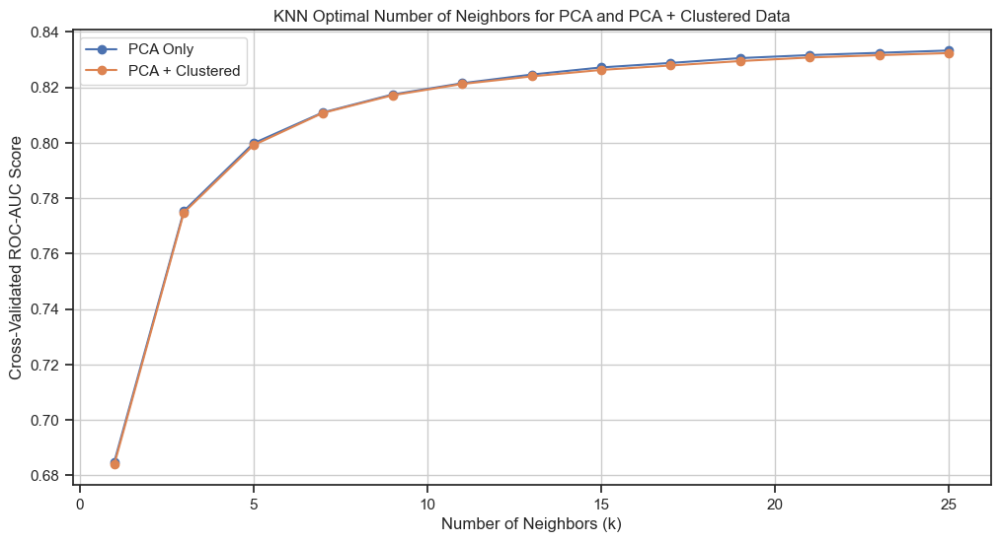

In [20]:
k_values = range(1, 26,2)
pca_scores = []
clustered_scores = []

for k in k_values:
#kNN for PCA-transformed data (without clusters)
    knn_pca = KNeighborsClassifier(n_neighbors=k)
    pca_score = cross_val_score(knn_pca, x_train_pca, Y_train, cv=5, scoring='roc_auc')
    pca_scores.append(pca_score.mean())
    
#kNN for PCA + Clustered data (with clusters)
    knn_clustered = KNeighborsClassifier(n_neighbors=k)
    clustered_score = cross_val_score(knn_clustered, x_train_cluster, Y_train, cv=5, scoring='roc_auc')
    clustered_scores.append(clustered_score.mean())

# finding the optimal k for each dataset
# optimal_k_pca = k_values[np.argmax(pca_scores)]
# optimal_k_clustered = k_values[np.argmax(clustered_scores)]
# print("Optimal k for PCA data:", optimal_k_pca)
# print("Optimal k for PCA + Clustered data:", optimal_k_clustered)

# Plotting k values against cross-validation scores for both datasets
plt.figure(figsize=(12, 6))
plt.plot(k_values, pca_scores, marker='o', label='PCA Only')
plt.plot(k_values, clustered_scores, marker='o', label='PCA + Clustered')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Cross-Validated ROC-AUC Score')
plt.title('KNN Optimal Number of Neighbors for PCA and PCA + Clustered Data')
plt.legend()
plt.grid(True)
plt.show()

Using 21 for K as after 20 deminissioning returns, so 21 is choosen to avoid ties during prediction.

### Training KNN and comparing both model's performance

,Model,ROC-AUC,Precision,Recall,Accuracy,F1 Score
0,PCA Only,0.829660,0.692793,0.780937,0.750283,0.734229
1,PCA + Clustered,0.829243,0.691891,0.780510,0.749529,0.733534


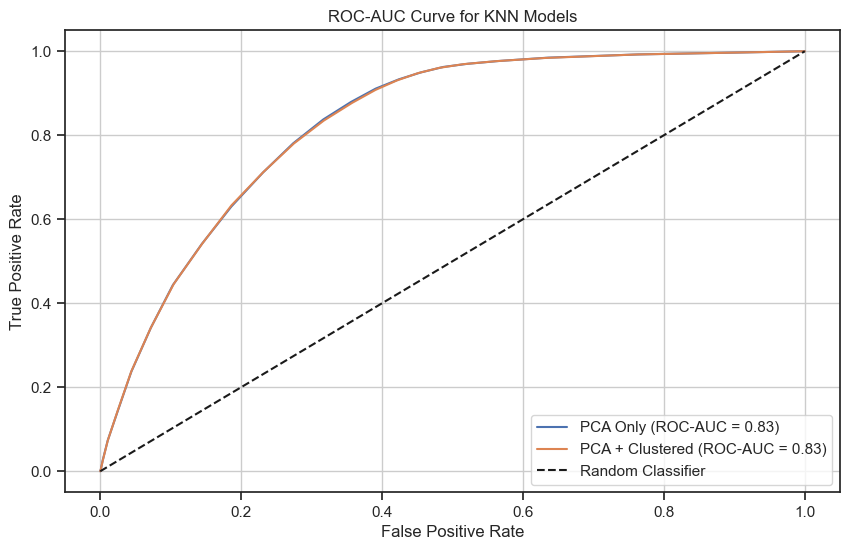

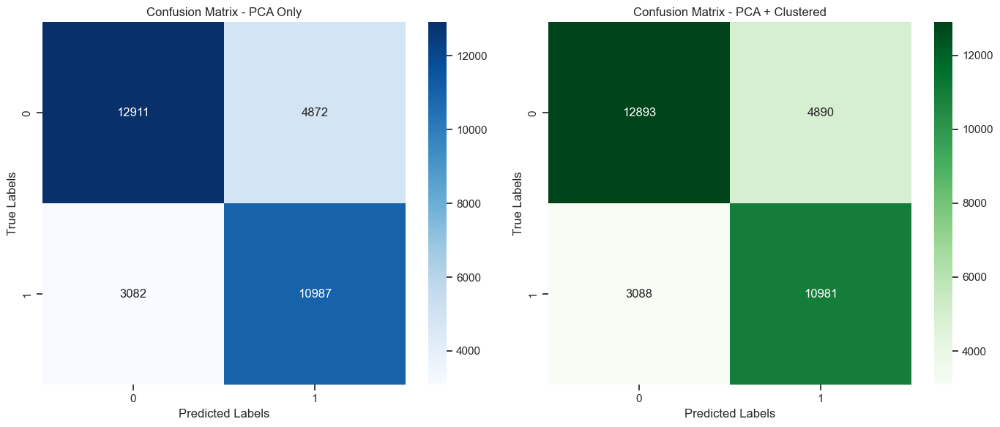

In [21]:
# training KNN model on PCA-transformed data
knn_pca = KNeighborsClassifier(n_neighbors=21)
knn_pca.fit(x_train_pca, Y_train)

# training KNN model on PCA + Clustered data
knn_clustered = KNeighborsClassifier(n_neighbors=21)
knn_clustered.fit(x_train_cluster, Y_train)

# predeicting 
y_pred_pca = knn_pca.predict(x_test_pca)
y_pred_clustered = knn_clustered.predict(x_test_cluster)

# calculating probabilities for ROC-AUC curve
y_prob_pca = knn_pca.predict_proba(x_test_pca)[:, 1]
y_prob_clustered = knn_clustered.predict_proba(x_test_cluster)[:, 1]

metrics = {
    "Model": ["PCA Only", "PCA + Clustered"],
    "ROC-AUC": [roc_auc_score(Y_test, y_prob_pca), roc_auc_score(Y_test, y_prob_clustered)],
    "Precision": [precision_score(Y_test, y_pred_pca), precision_score(Y_test, y_pred_clustered)],
    "Recall": [recall_score(Y_test, y_pred_pca), recall_score(Y_test, y_pred_clustered)],
    "Accuracy": [accuracy_score(Y_test, y_pred_pca), accuracy_score(Y_test, y_pred_clustered)],
    "F1 Score": [f1_score(Y_test, y_pred_pca), f1_score(Y_test, y_pred_clustered)]
}
metrics_df = pd.DataFrame(metrics)
display_table(metrics_df, "KNN Model Performance Comparison (PCA Only vs PCA + Clustered)")

#  ROC curves
plt.figure(figsize=(10, 6))
fpr_pca, tpr_pca, _ = roc_curve(Y_test, y_prob_pca)
fpr_clustered, tpr_clustered, _ = roc_curve(Y_test, y_prob_clustered)
plt.plot(fpr_pca, tpr_pca, label="PCA Only (ROC-AUC = {:.2f})".format(metrics["ROC-AUC"][0]))
plt.plot(fpr_clustered, tpr_clustered, label="PCA + Clustered (ROC-AUC = {:.2f})".format(metrics["ROC-AUC"][1]))
plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-AUC Curve for KNN Models")
plt.legend()
plt.grid(True)
plt.show()
print("\n")

#confusion matrices for both models
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.heatmap(confusion_matrix(Y_test, y_pred_pca), annot=True, fmt="d", cmap="Blues", ax=axs[0])
axs[0].set_title("Confusion Matrix - PCA Only")
axs[0].set_xlabel("Predicted Labels")
axs[0].set_ylabel("True Labels")

sns.heatmap(confusion_matrix(Y_test, y_pred_clustered), annot=True, fmt="d", cmap="Greens", ax=axs[1])
axs[1].set_title("Confusion Matrix - PCA + Clustered")
axs[1].set_xlabel("Predicted Labels")
axs[1].set_ylabel("True Labels")

plt.tight_layout()
plt.show()

### Evaluation Metrics Summary

| Model             | ROC-AUC | Precision | Recall  | Accuracy | F1 Score |
|-------------------|---------|-----------|---------|----------|----------|
| **PCA Only**      | 0.8297  | 0.6928    | 0.7809  | 0.7503   | 0.7342   |
| **PCA + Clustered** | 0.8292  | 0.6919    | 0.7805  | 0.7495   | 0.7335   |

- **Precision**: The precision values for both models are very similar, with PCA-only slightly higher at 0.6928.

- **Recall**: Both models achieved nearly the same recall, indicating a similar rate of correctly identifying positive instances.

- **Accuracy** and **F1 Score**: The accuracy and F1 scores are also almost identical, with a slight advantage for the PCA-only model.

### Conclusion
The addition of clustering did not produce a significant improvement in KNN performance. Both models exhibit nearly identical performance across all evaluation metrics, suggesting that clustering does not add notable value to this particular classification task with KNN. Given these results, the simpler **PCA-only model** is a more efficient choice for further processing.


## Naive Bayes Classification

,Model,ROC-AUC,Precision,Recall,Accuracy,F1 Score
0,PCA Only,0.787499,0.515073,0.948468,0.582821,0.667601
1,PCA + Clustered,0.793245,0.615381,0.903191,0.707899,0.732012


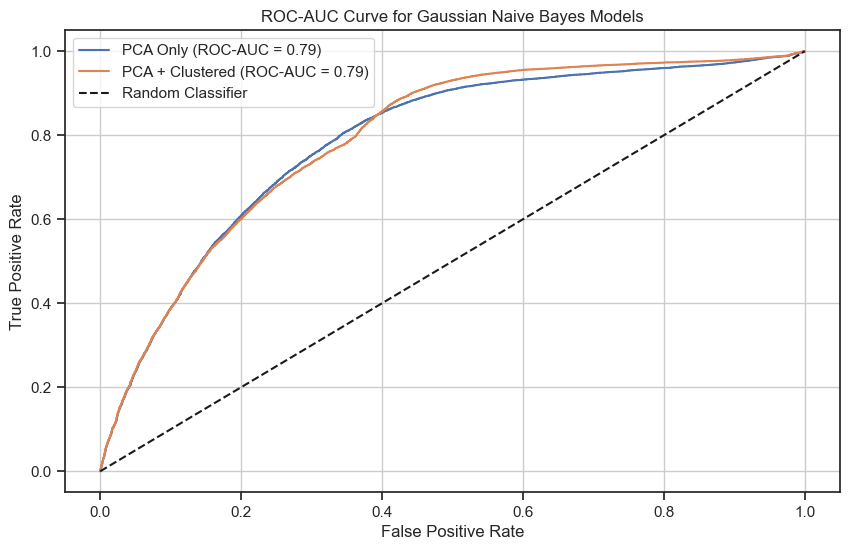

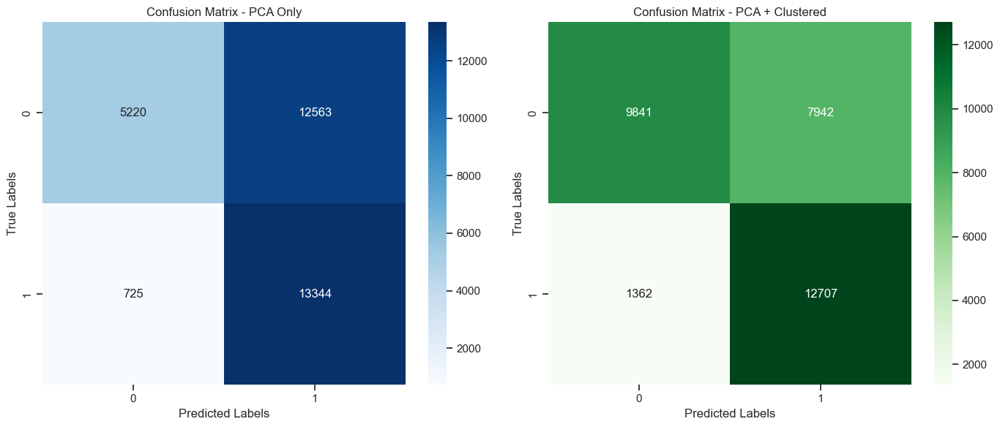

In [23]:
nb_pca = GaussianNB()
nb_clustered = GaussianNB()

# training
nb_pca.fit(x_train_pca, Y_train)
nb_clustered.fit(x_train_cluster, Y_train)

# prediction
y_pred_pca = nb_pca.predict(x_test_pca)
y_pred_clustered = nb_clustered.predict(x_test_cluster)

# calculating probabilities for ROC-AUC curve
y_prob_pca = nb_pca.predict_proba(x_test_pca)[:, 1]
y_prob_clustered = nb_clustered.predict_proba(x_test_cluster)[:, 1]

metrics = {
    "Model": ["PCA Only", "PCA + Clustered"],
    "ROC-AUC": [roc_auc_score(Y_test, y_prob_pca), roc_auc_score(Y_test, y_prob_clustered)],
    "Precision": [precision_score(Y_test, y_pred_pca), precision_score(Y_test, y_pred_clustered)],
    "Recall": [recall_score(Y_test, y_pred_pca), recall_score(Y_test, y_pred_clustered)],
    "Accuracy": [accuracy_score(Y_test, y_pred_pca), accuracy_score(Y_test, y_pred_clustered)],
    "F1 Score": [f1_score(Y_test, y_pred_pca), f1_score(Y_test, y_pred_clustered)]
}
metrics_df = pd.DataFrame(metrics)
display_table(metrics_df, "Naive Bayes Model Performance Comparison (PCA Only vs PCA + Clustered)")

# ploting ROC curves
plt.figure(figsize=(10, 6))
fpr_pca, tpr_pca, _ = roc_curve(Y_test, y_prob_pca)
fpr_clustered, tpr_clustered, _ = roc_curve(Y_test, y_prob_clustered)
plt.plot(fpr_pca, tpr_pca, label="PCA Only (ROC-AUC = {:.2f})".format(metrics["ROC-AUC"][0]))
plt.plot(fpr_clustered, tpr_clustered, label="PCA + Clustered (ROC-AUC = {:.2f})".format(metrics["ROC-AUC"][1]))
plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-AUC Curve for Gaussian Naive Bayes Models")
plt.legend()
plt.grid(True)
plt.show()
print("\n")

# confusion matrices for both models
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.heatmap(confusion_matrix(Y_test, y_pred_pca), annot=True, fmt="d", cmap="Blues", ax=axs[0])
axs[0].set_title("Confusion Matrix - PCA Only")
axs[0].set_xlabel("Predicted Labels")
axs[0].set_ylabel("True Labels")

sns.heatmap(confusion_matrix(Y_test, y_pred_clustered), annot=True, fmt="d", cmap="Greens", ax=axs[1])
axs[1].set_title("Confusion Matrix - PCA + Clustered")
axs[1].set_xlabel("Predicted Labels")
axs[1].set_ylabel("True Labels")

plt.tight_layout()
plt.show()

### Evaluation Metrics Summary

| Model             | ROC-AUC | Precision | Recall  | Accuracy | F1 Score |
|-------------------|---------|-----------|---------|----------|----------|
| **PCA Only**      | 0.7875  | 0.5151    | 0.9485  | 0.5828   | 0.6676   |
| **PCA + Clustered** | 0.7932  | 0.6154    | 0.9032  | 0.7079   | 0.7320   |

- **Precision**: The PCA + Clustered model achieves a higher precision of 0.6154, indicating it is better at correctly predicting positive instances (smokers) without including as many false positives.

- **Recall**: The PCA-only model has a slightly higher recall (0.9485), which indicates it is more effective at identifying positive cases, although with more false positives.

- **Accuracy** and **F1 Score**: The PCA + Clustered model exhibits better accuracy (0.7079) and F1 score (0.7320), which highlights a better balance between precision and recall for this model.

### Conclusion
The **PCA + Clustered model** shows improved performance over the PCA-only model in identifying non-smoking instances (higher True Negative count), achieving a better balance between precision and recall, and yielding higher accuracy and F1 score. This suggests that clustering enhances the Naive Bayes classifier's ability to handle this classification problem effectively.


## Decision Tree Classifier

#### Finding optimal Hyper Parameters


In [24]:
# hyperparameter grid
param_grid = {
    'max_depth': [5, 10, 15, 20, 25, None],  # Depth of the tree
    'min_samples_split': [2, 5, 10, 15],     # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 5, 10],       # Minimum samples in a leaf node
    'max_features': [None, 'sqrt', 'log2']   # Number of features to consider at each split
}

def tune_decision_tree(X_train, Y_train, X_val, Y_val, param_grid):
# initializing the Decision Tree model
    dt_model = DecisionTreeClassifier(random_state=42)
    
# GridSearchCV for exhaustive search
    grid_search = GridSearchCV(dt_model, param_grid, scoring='roc_auc', cv=3, n_jobs=-1)
    grid_search.fit(X_train, Y_train)
    
# geting best parameters and evaluate on validation set
    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_
    y_val_prob = best_model.predict_proba(X_val)[:, 1]
    best_score = roc_auc_score(Y_val, y_val_prob)
    
    return best_params, best_score

# tuneing Decision Tree for PCA-only data
best_params_pca, best_score_pca = tune_decision_tree(x_train_pca, Y_train, x_val_pca, Y_val, param_grid)
print("Best parameters for PCA-only data:", best_params_pca)
print("Best ROC-AUC on validation for PCA-only data:", best_score_pca)

# tunnig Decision Tree for PCA + Clustered data
best_params_clustered, best_score_clustered = tune_decision_tree(x_train_cluster, Y_train, x_val_cluster, Y_val, param_grid)
print("Best parameters for PCA + Clustered data:", best_params_clustered)
print("Best ROC-AUC on validation for PCA + Clustered data:", best_score_clustered)

results_df = pd.DataFrame({
    'Dataset': ['PCA Only', 'PCA + Clustered'],
    'Best max_depth': [best_params_pca['max_depth'], best_params_clustered['max_depth']],
    'Best min_samples_split': [best_params_pca['min_samples_split'], best_params_clustered['min_samples_split']],
    'Best min_samples_leaf': [best_params_pca['min_samples_leaf'], best_params_clustered['min_samples_leaf']],
    'Best max_features': [best_params_pca.get('max_features'), best_params_clustered.get('max_features')],
    'Validation ROC-AUC': [best_score_pca, best_score_clustered]
})
display_table(results_df, "Best Hyperparameters and Validation ROC-AUC for Decision Tree (PCA Only vs PCA + Clustered)")

Best parameters for PCA-only data: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 10, 'min_samples_split': 2}
Best ROC-AUC on validation for PCA-only data: 0.8070361399529902
Best parameters for PCA + Clustered data: {'max_depth': 5, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best ROC-AUC on validation for PCA + Clustered data: 0.8042093900493065


,Dataset,Best max_depth,Best min_samples_split,Best min_samples_leaf,Best max_features,Validation ROC-AUC
0,PCA Only,10,2,10,None,0.807036
1,PCA + Clustered,5,2,1,None,0.804209


### Training Decision Tree

,Model,ROC-AUC,Accuracy,Precision,Recall,F1 Score
0,PCA Only,0.809182,0.734020,0.671508,0.778804,0.721187
1,PCA + Clustered,0.805870,0.728808,0.675363,0.743336,0.707721


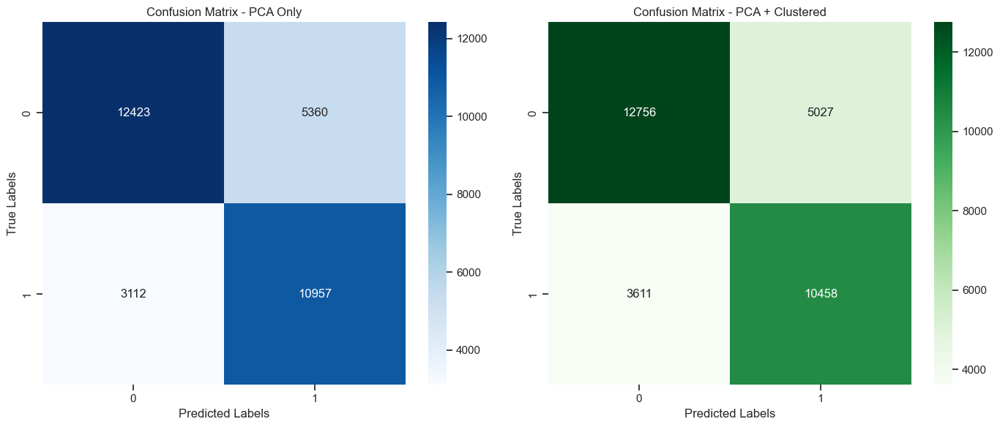

In [25]:
best_params_pca = {'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 10, 'max_features': None}
best_params_clustered = {'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}

def train_and_evaluate_decision_tree(X_train, Y_train, X_test, Y_test, params, dataset_name):
    dt_model = DecisionTreeClassifier(
        max_depth=params['max_depth'],
        min_samples_split=params['min_samples_split'],
        min_samples_leaf=params['min_samples_leaf'],
        max_features=params['max_features'],
        random_state=42
    )
    dt_model.fit(X_train, Y_train)
    
# prediction probabilities for ROC-AUC calculation
    y_test_prob = dt_model.predict_proba(X_test)[:, 1]
    roc_auc = roc_auc_score(Y_test, y_test_prob)
    
# predicting classes for other metrics
    y_test_pred = dt_model.predict(X_test)
    accuracy = accuracy_score(Y_test, y_test_pred)
    precision = precision_score(Y_test, y_test_pred)
    recall = recall_score(Y_test, y_test_pred)
    f1 = f1_score(Y_test, y_test_pred)
    
    conf_matrix = confusion_matrix(Y_test, y_test_pred)
    
  # print results
  # print(f"Results for {dataset_name}:")
  # print(f"ROC-AUC: {roc_auc:.4f}")
  # print(f"Accuracy: {accuracy:.4f}")
  # print(f"Precision: {precision:.4f}")
  # print(f"Recall: {recall:.4f}")
  # print(f"F1 Score: {f1:.4f}")
  # print(f"Confusion Matrix:\n{conf_matrix}\n")

    return roc_auc, accuracy, precision, recall, f1, conf_matrix

# evaluating Decision Tree for PCA-only data
results_pca = train_and_evaluate_decision_tree(x_train_pca, Y_train, x_test_pca, Y_test, best_params_pca, "PCA Only")

# evaluating Decision Tree for PCA + Clustered data
results_clustered = train_and_evaluate_decision_tree(x_train_cluster, Y_train, x_test_cluster, Y_test, best_params_clustered, "PCA + Clustered")

results_df = pd.DataFrame({
    'Model': ['PCA Only', 'PCA + Clustered'],
    'ROC-AUC': [results_pca[0], results_clustered[0]],
    'Accuracy': [results_pca[1], results_clustered[1]],
    'Precision': [results_pca[2], results_clustered[2]],
    'Recall': [results_pca[3], results_clustered[3]],
    'F1 Score': [results_pca[4], results_clustered[4]]
})

display_table(results_df, "Decision Tree Model Performance (PCA Only vs PCA + Clustered)")

# confusion matrices
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.heatmap(results_pca[5], annot=True, fmt="d", cmap="Blues", ax=axs[0])
axs[0].set_title("Confusion Matrix - PCA Only")
axs[0].set_xlabel("Predicted Labels")
axs[0].set_ylabel("True Labels")

sns.heatmap(results_clustered[5], annot=True, fmt="d", cmap="Greens", ax=axs[1])
axs[1].set_title("Confusion Matrix - PCA + Clustered")
axs[1].set_xlabel("Predicted Labels")
axs[1].set_ylabel("True Labels")

plt.tight_layout()
plt.show()

* ROC-AUC: The PCA-only model achieved a slightly higher ROC-AUC score (0.809) compared to PCA + Clustered (0.806), indicating a better balance between true positive and false positive rates.

* Accuracy: Similarly, the PCA-only model has a marginally higher accuracy (73.4%) than the PCA + Clustered model (72.9%).

* Precision, Recall, and F1 Score: The precision is slightly lower in the PCA-only model, but recall is higher, resulting in a higher F1 score for PCA-only. This shows that the PCA-only model is more effective in identifying the positive class (1s) without missing as many cases.

## Comparing the best performing models

In [26]:
# definingb each model with the best hyperparameters identified earlier
model_knn_pca = KNeighborsClassifier(n_neighbors=21)
model_nb_pca_clustered = GaussianNB()
model_dt_pca = DecisionTreeClassifier(max_depth=10, min_samples_split=2, min_samples_leaf=10, max_features=None, random_state=42)

# traiing each model on the respective training data
model_knn_pca.fit(x_train_pca, Y_train)
model_nb_pca_clustered.fit(x_train_cluster, Y_train)
model_dt_pca.fit(x_train_pca, Y_train)

models = {
    "KNN (PCA Only)": model_knn_pca,
    "Naive Bayes (PCA + Clustered)": model_nb_pca_clustered,
    "Decision Tree (PCA Only)": model_dt_pca
}

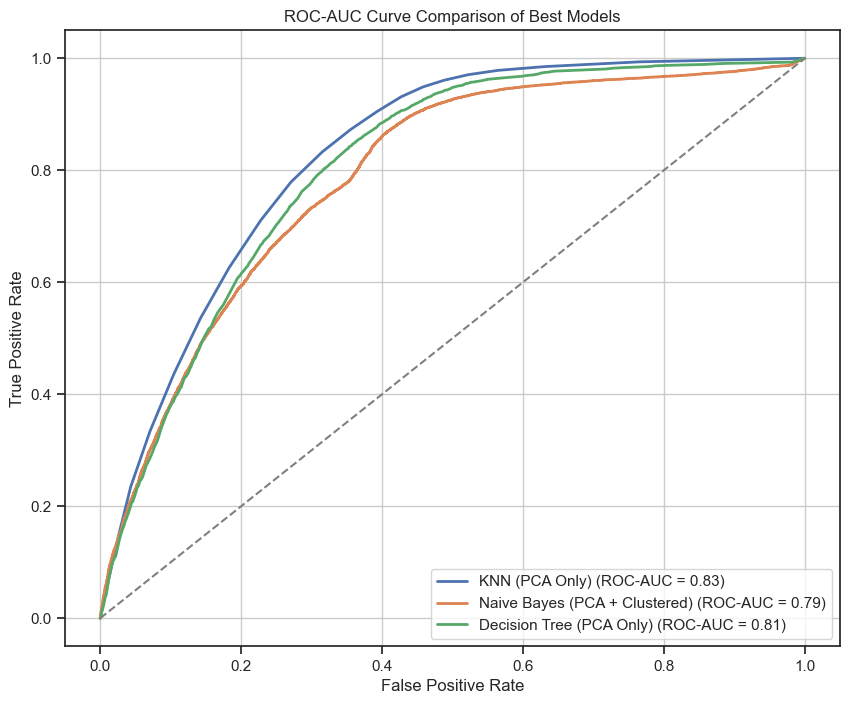

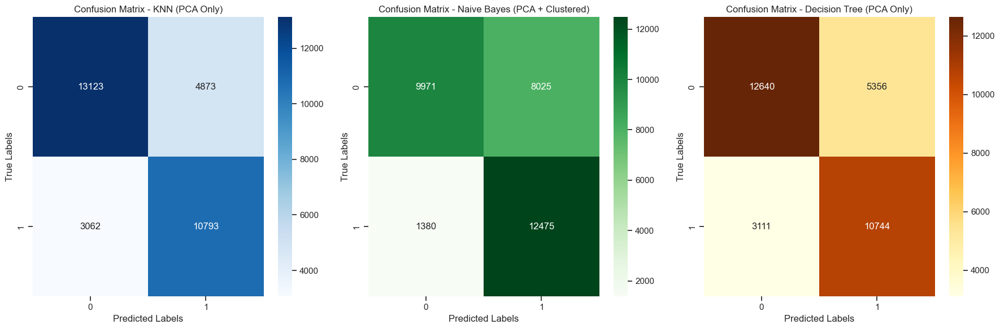

,Model,ROC-AUC,Accuracy,Precision,Recall,F1 Score
0,KNN (PCA Only),0.828881,0.750871,0.688944,0.778997,0.731208
1,Naive Bayes (PCA + Clustered),0.788912,0.704719,0.608537,0.900397,0.726241
2,Decision Tree (PCA Only),0.807036,0.734168,0.667329,0.775460,0.717343


In [27]:
# ploting ROC-AUC curves for each model
plt.figure(figsize=(10, 8))
for name, model in models.items():
    if "PCA Only" in name:
        y_val_prob = model.predict_proba(x_val_pca)[:, 1]
    else:
        y_val_prob = model.predict_proba(x_val_cluster)[:, 1]

    fpr, tpr, _ = roc_curve(Y_val, y_val_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{name} (ROC-AUC = {roc_auc:.2f})')

# random classifier line
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-AUC Curve Comparison of Best Models")
plt.legend(loc="lower right")
plt.grid()
plt.show()
print("\n")
#  confusionmatrixes
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
cl=['Blues', 'Greens', 'YlOrBr']
for idx, (name, model) in enumerate(models.items()):
    if "PCA Only" in name:
        y_val_pred = model.predict(x_val_pca)
    else:
        y_val_pred = model.predict(x_val_cluster)

    cm = confusion_matrix(Y_val, y_val_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap=cl[idx], ax=axes[idx])
    axes[idx].set_title(f"Confusion Matrix - {name}")
    axes[idx].set_xlabel("Predicted Labels")
    axes[idx].set_ylabel("True Labels")
plt.tight_layout()
plt.show()
print("\n")
# summary
metrics = {
    'Model': [],
    'ROC-AUC': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 Score': []
}

#calculating metrics for each model
for name, model in models.items():
    if "PCA Only" in name:
        y_val_pred = model.predict(x_val_pca)
        y_val_prob = model.predict_proba(x_val_pca)[:, 1]
    else:
        y_val_pred = model.predict(x_val_cluster)
        y_val_prob = model.predict_proba(x_val_cluster)[:, 1]

    metrics['Model'].append(name)
    metrics['ROC-AUC'].append(roc_auc_score(Y_val, y_val_prob))
    metrics['Accuracy'].append(accuracy_score(Y_val, y_val_pred))
    metrics['Precision'].append(precision_score(Y_val, y_val_pred))
    metrics['Recall'].append(recall_score(Y_val, y_val_pred))
    metrics['F1 Score'].append(f1_score(Y_val, y_val_pred))

metrics_df = pd.DataFrame(metrics)
display_table(metrics_df, "Evaluation Metrics Comparison of Best Models")

* KNN (PCA Only) is the strongest performer overall, achieving the best balance between ROC-AUC, accuracy, precision, and recall.

* Naive Bayes (PCA + Clustered) is highly sensitive with high recall, which may be preferred if capturing all positives is critical.

* Decision Tree (PCA Only) provides a balanced approach, useful in scenarios requiring moderate sensitivity and specificity.

For ensembling, combining KNN and Decision Tree might yield a robust model with balanced performance. Alternatively, if high sensitivity is a priority, including Naive Bayes in the ensemble could strengthen recall.

## Ensemble Model Trainig

### Hard vs Soft voting

,Model,ROC-AUC,Accuracy,Precision,Recall,F1 Score
0,Hard Voting,0.754961,0.742049,0.656352,0.854276,0.742348
1,Soft Voting,0.826390,0.728423,0.631699,0.900974,0.742682


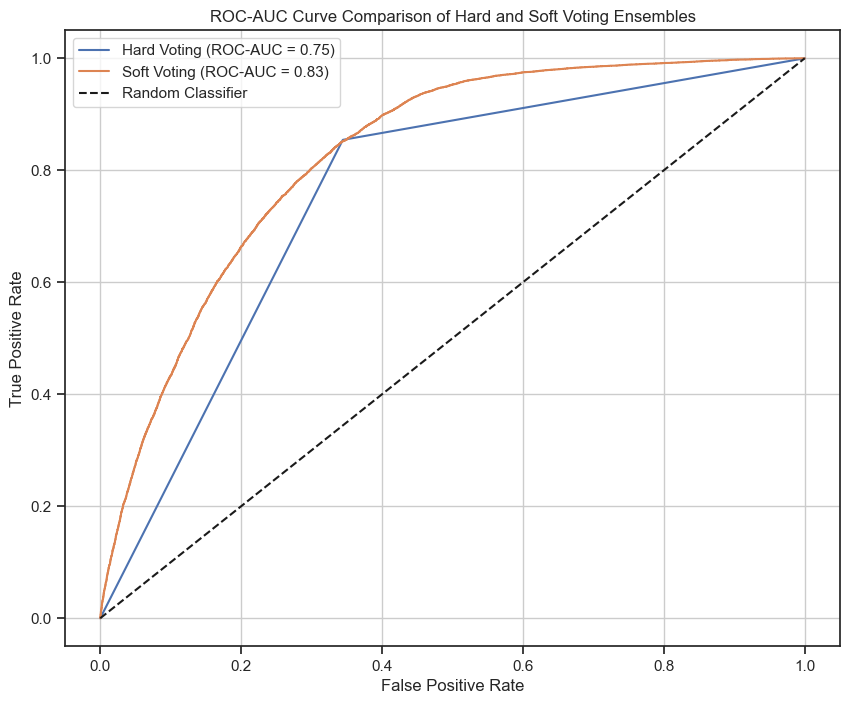

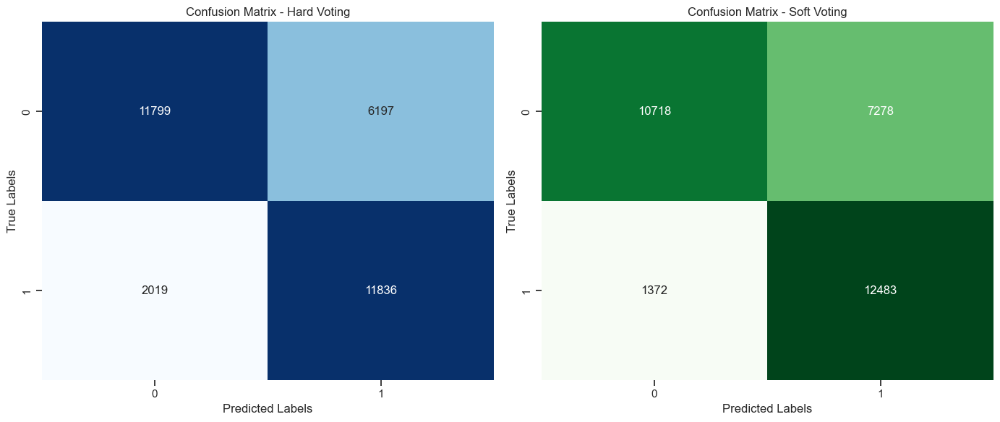

In [28]:
# defineing the Hard Voting Ensemble
voting_clf_hard = VotingClassifier(
    estimators=[
        ('KNN', model_knn_pca),
        ('Naive Bayes', model_nb_pca_clustered),
        ('Decision Tree', model_dt_pca)
    ],
    voting='hard'
)

# defineing the Soft Voting Ensemble
voting_clf_soft = VotingClassifier(
    estimators=[
        ('KNN', model_knn_pca),
        ('Naive Bayes', model_nb_pca_clustered),
        ('Decision Tree', model_dt_pca)
    ],
    voting='soft'
)

voting_clf_hard.fit(x_train_pca, Y_train)
voting_clf_soft.fit(x_train_pca, Y_train)

y_val_pred_hard = voting_clf_hard.predict(x_val_pca)
roc_auc_hard = roc_auc_score(Y_val, y_val_pred_hard)

y_val_pred_soft = voting_clf_soft.predict(x_val_pca)
y_val_prob_soft = voting_clf_soft.predict_proba(x_val_pca)[:, 1]
roc_auc_soft = roc_auc_score(Y_val, y_val_prob_soft)

def evaluate_model_performance(y_true, y_pred, y_prob=None):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_prob) if y_prob is not None else roc_auc_score(y_true, y_pred)
    cm = confusion_matrix(y_true, y_pred)
    return accuracy, precision, recall, f1, roc_auc, cm


hard_metrics = evaluate_model_performance(Y_val, y_val_pred_hard)
soft_metrics = evaluate_model_performance(Y_val, y_val_pred_soft, y_val_prob_soft)

summary_data = {
    'Model': ['Hard Voting', 'Soft Voting'],
    'ROC-AUC': [hard_metrics[4], soft_metrics[4]],
    'Accuracy': [hard_metrics[0], soft_metrics[0]],
    'Precision': [hard_metrics[1], soft_metrics[1]],
    'Recall': [hard_metrics[2], soft_metrics[2]],
    'F1 Score': [hard_metrics[3], soft_metrics[3]]
}
summary_df = pd.DataFrame(summary_data)
display_table(summary_df, "Evaluation Summary for Hard and Soft Voting Ensembles")

# ROC-AUC Curves
plt.figure(figsize=(10, 8))
fpr_hard, tpr_hard, _ = roc_curve(Y_val, y_val_pred_hard)
fpr_soft, tpr_soft, _ = roc_curve(Y_val, y_val_prob_soft)

plt.plot(fpr_hard, tpr_hard, label=f'Hard Voting (ROC-AUC = {roc_auc_hard:.2f})')
plt.plot(fpr_soft, tpr_soft, label=f'Soft Voting (ROC-AUC = {roc_auc_soft:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-AUC Curve Comparison of Hard and Soft Voting Ensembles")
plt.legend()
plt.grid(True)
plt.show()
print("\n")

# Plotting Confusion Matrices
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.heatmap(hard_metrics[5], annot=True, fmt="d", cmap="Blues", cbar=False, ax=axs[0])
axs[0].set_title("Confusion Matrix - Hard Voting")
axs[0].set_xlabel("Predicted Labels")
axs[0].set_ylabel("True Labels")

sns.heatmap(soft_metrics[5], annot=True, fmt="d", cmap="Greens", cbar=False, ax=axs[1])
axs[1].set_title("Confusion Matrix - Soft Voting")
axs[1].set_xlabel("Predicted Labels")
axs[1].set_ylabel("True Labels")

plt.tight_layout()
plt.show()

* Soft Voting achieved a higher ROC-AUC (0.826) compared to Hard Voting (0.755), indicating a better balance between true positives and false positives.

* Recall is significantly higher in Soft Voting (0.901) than in Hard Voting (0.854), making Soft Voting better at identifying positive instances.

* Precision is slightly lower in Soft Voting than Hard Voting, but the difference is minimal.

## Weighted Voting

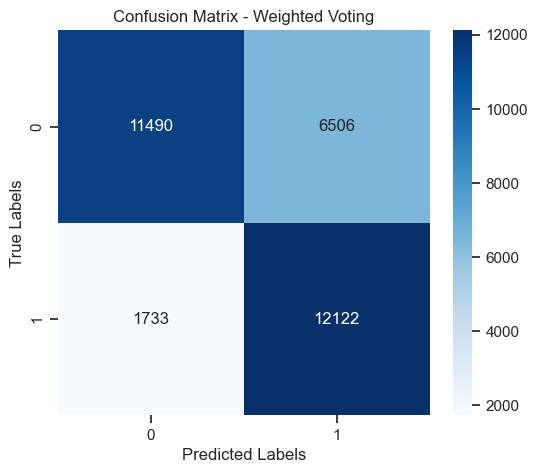

,Model,ROC-AUC,Accuracy,Precision,Recall,F1 Score
0,Weighted Voting,0.830536,0.741327,0.650741,0.874919,0.746360


In [29]:
# weighted voting ensemble with proposed weights
voting_clf_weighted = VotingClassifier(
    estimators=[
        ("KNN (PCA Only)", model_knn_pca),
        ("Naive Bayes (PCA + Clustered)", model_nb_pca_clustered),
        ("Decision Tree (PCA Only)", model_dt_pca)
    ],
    voting='soft',
    weights=[2, 1, 1.5]
)
voting_clf_weighted.fit(x_train_pca, Y_train)

y_val_prob_weighted = voting_clf_weighted.predict_proba(x_val_pca)[:, 1]
y_val_pred_weighted = voting_clf_weighted.predict(x_val_pca)
roc_auc_weighted = roc_auc_score(Y_val, y_val_prob_weighted)
precision_weighted = precision_score(Y_val, y_val_pred_weighted)
recall_weighted = recall_score(Y_val, y_val_pred_weighted)
f1_weighted = f1_score(Y_val, y_val_pred_weighted)
accuracy_weighted = accuracy_score(Y_val, y_val_pred_weighted)

conf_matrix_weighted = confusion_matrix(Y_val, y_val_pred_weighted)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_weighted, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Weighted Voting")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Describing plot ROC curve
# Describing fpr_weighted, tpr_weighted, _ = roc_curve(Y_val, y_val_prob_weighted)
# Describing plt.figure(figsize=(10, 8))
# Describing plt.plot(fpr_weighted, tpr_weighted, label=f"Weighted Voting (ROC-AUC = {roc_auc_weighted:.2f})", color="purple")
# Describing plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier")
# Describing plt.xlabel("False Positive Rate")
# Describing plt.ylabel("True Positive Rate")
# Describing plt.title("ROC-AUC Curve for Weighted Voting Ensemble")
# Describing plt.legend()
# Describing plt.grid(True)
# Describing plt.show()

results_df = pd.DataFrame({
    "Model": ["Weighted Voting"],
    "ROC-AUC": [roc_auc_weighted],
    "Accuracy": [accuracy_weighted],
    "Precision": [precision_weighted],
    "Recall": [recall_weighted],
    "F1 Score": [f1_weighted]
})
display_table(results_df, "Performance Summary for Weighted Voting Ensemble")

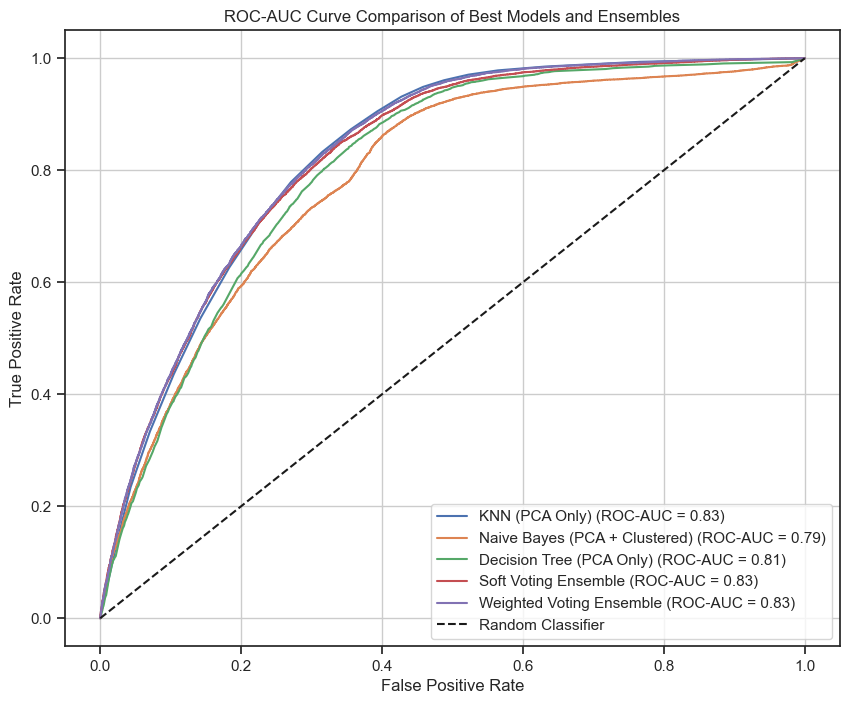

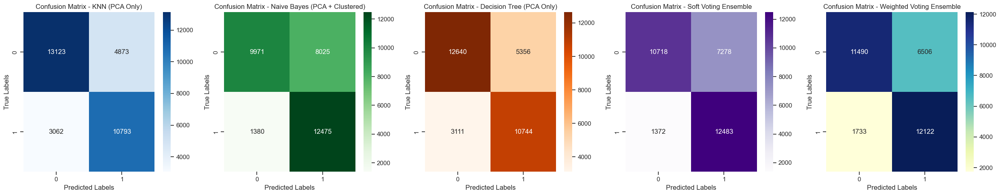

,Model,ROC-AUC,Accuracy,Precision,Recall,F1 Score
0,KNN (PCA Only),0.828881,0.750871,0.688944,0.778997,0.731208
1,Naive Bayes (PCA + Clustered),0.788912,0.704719,0.608537,0.900397,0.726241
2,Decision Tree (PCA Only),0.807036,0.734168,0.667329,0.775460,0.717343
3,Soft Voting Ensemble,0.826390,0.728423,0.631699,0.900974,0.742682
4,Weighted Voting Ensemble,0.830536,0.741327,0.650741,0.874919,0.746360


In [30]:
#dictionary to store models 
comparison_models = {
    "KNN (PCA Only)": model_knn_pca,
    "Naive Bayes (PCA + Clustered)": model_nb_pca_clustered,
    "Decision Tree (PCA Only)": model_dt_pca,
    "Soft Voting Ensemble": voting_clf_soft,
    "Weighted Voting Ensemble": voting_clf_weighted
}

# mapping each model to its corresponding validation dataset
validation_data = {
    "KNN (PCA Only)": x_val_pca,
    "Naive Bayes (PCA + Clustered)": x_val_cluster,
    "Decision Tree (PCA Only)": x_val_pca,
    "Soft Voting Ensemble": x_val_pca,  # Assuming majority of models use PCA only here for simplicity
    "Weighted Voting Ensemble": x_val_pca
}

plt.figure(figsize=(10, 8))
roc_auc_scores = {}

for name, model in comparison_models.items():
    X_val = validation_data[name]
    y_val_prob = model.predict_proba(X_val)[:, 1]
    fpr, tpr, _ = roc_curve(Y_val, y_val_prob)
    roc_auc = roc_auc_score(Y_val, y_val_prob)
    roc_auc_scores[name] = roc_auc
    plt.plot(fpr, tpr, label=f"{name} (ROC-AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-AUC Curve Comparison of Best Models and Ensembles")
plt.legend()
plt.grid(True)
plt.show()
print("\n")

colormaps = ['Blues', 'Greens', 'Oranges', 'Purples', 'YlGnBu']
fig, axs = plt.subplots(1, 5, figsize=(25, 5))
for i, (name, model) in enumerate(comparison_models.items()):
    X_val = validation_data[name]
    y_val_pred = model.predict(X_val)
    cm = confusion_matrix(Y_val, y_val_pred)
    sns.heatmap(cm, annot=True, fmt="d", cmap=colormaps[i], ax=axs[i])
    axs[i].set_title(f"Confusion Matrix - {name}")
    axs[i].set_xlabel("Predicted Labels")
    axs[i].set_ylabel("True Labels")

plt.tight_layout()
plt.show()
print("\n")

results = {
    "Model": [],
    "ROC-AUC": [],
    "Accuracy": [],
    "Precision": [],
    "Recall": [],
    "F1 Score": []
}
for name, model in comparison_models.items():
    X_val = validation_data[name]
    y_val_pred = model.predict(X_val)
    y_val_prob = model.predict_proba(X_val)[:, 1]
    
    results["Model"].append(name)
    results["ROC-AUC"].append(roc_auc_scores[name])
    results["Accuracy"].append(accuracy_score(Y_val, y_val_pred))
    results["Precision"].append(precision_score(Y_val, y_val_pred))
    results["Recall"].append(recall_score(Y_val, y_val_pred))
    results["F1 Score"].append(f1_score(Y_val, y_val_pred))
results_df = pd.DataFrame(results)
display_table(results_df, "Comparison of Individual Models and Ensembles")

### Model Comparison Summary

1. **ROC-AUC Performance**:
   - The **Weighted Voting Ensemble** achieved the highest ROC-AUC score (0.8305), slightly outperforming both the individual models and the Soft Voting Ensemble.
   - The **KNN (PCA Only)** model performed well with a ROC-AUC score of 0.8289, making it the best individual model in terms of this metric.

2. **Accuracy and F1 Score**:
   - The Weighted Voting Ensemble also showed an advantage in **Accuracy** (0.7413) and **F1 Score** (0.7464) over other methods, indicating a strong balance between precision and recall.
   - The **KNN (PCA Only)** and **Decision Tree (PCA Only)** models demonstrated good F1 Scores, though slightly lower than the ensemble methods.

3. **Precision and Recall**:
   - The **Naive Bayes (PCA + Clustered)** model excelled in **Recall** (0.9004), effectively identifying true positive cases, which is beneficial for imbalanced datasets or critical classification tasks.
   - Both ensemble methods exhibited balanced performance, with Soft Voting leaning more towards higher recall, while Weighted Voting offered a balanced approach to both precision and recall.

### Conclusion

The **Weighted Voting Ensemble** provides the best overall performance in terms of ROC-AUC, accuracy, and F1 score, making it the preferred choice as the final model. The **Soft Voting Ensemble** is also competitive, particularly in scenarios where high recall is prioritized. However, the **Weighted Voting Ensemble** balances precision and recall effectively, making it an ideal choice for this classification task.

The **Weighted Voting Ensemble** model will be pickled to keep it deployment-ready for future use.
